## DataScience

### stroke prediction data [source](https://www.kaggle.com/fedesoriano/stroke-prediction-dataset)

In [271]:
#### imports ####

# utility
import pandas as pd
import numpy as np
import statistics as sts
import scipy.stats

# classifiers
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression

# imputation
from sklearn.impute import KNNImputer

# standardize continuous features
from sklearn.preprocessing import StandardScaler

# encode categorical variables
from sklearn.preprocessing import LabelEncoder

# create sub data
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit

# accuracy, precision, recall, f1score
from sklearn.metrics import classification_report, confusion_matrix

# metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

# plotting
import matplotlib.pyplot as plt
# from matplotlib.colors import ListedColormap

from sklearn.metrics import roc_auc_score, roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn import svm



In [272]:
df = pd.read_csv("./stroke_prediction_dataset/healthcare-dataset-stroke-data.csv")


In [273]:
df.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [297]:
df['smoking_status'].value_counts()

never smoked       1892
Unknown            1544
formerly smoked     885
smokes              789
Name: smoking_status, dtype: int64

In [295]:
df['bmi'].describe()

count    4909.000000
mean       28.893237
std         7.854067
min        10.300000
25%        23.500000
50%        28.100000
75%        33.100000
max        97.600000
Name: bmi, dtype: float64

In [296]:
df.shape

(5110, 12)

In [6]:
df['stroke'].value_counts()

0    4861
1     249
Name: stroke, dtype: int64

### Transform strings to numerical categories

In [7]:
LE = LabelEncoder() # from sklearn
df['gender'] = LE.fit_transform(df['gender']) # Male = 1, Female = 0
df['ever_married'] = LE.fit_transform(df['ever_married']) # ... make sure not to confuse categories
df['work_type'] = LE.fit_transform(df['work_type'])
df['Residence_type'] = LE.fit_transform(df['Residence_type'])
df['smoking_status'] = LE.fit_transform(df['smoking_status'])

### Let's have a look where missings occur:

In [8]:
print(df.isnull().sum())

id                     0
gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64


In [9]:
df.stroke.value_counts()

0    4861
1     249
Name: stroke, dtype: int64

## Impute BMI values

### df1: we want to imputate BMI Values depending on gender and age (<= 18 vs > 18).

In [10]:
# use df1
df1 = df.copy() # make sure to make deep copy!

# create sub dataframes
adult_male   = df1[(df1["age"] > 18) & (df1["gender"] == 1)]
adult_female = df1[(df1["age"] > 18) & (df1["gender"] == 0)]
child_male   = df1[(df1["age"] < 19) & (df1["gender"] == 1)] 
child_female = df1[(df1["age"] < 19) & (df1["gender"] == 0)]

In [11]:
# drop NA rows
adult_male = adult_male.dropna()
adult_female = adult_female.dropna()
child_male = child_male.dropna()
child_female = child_female.dropna()

# get median BMI
adult_male_medianBMI   = sts.median(adult_male["bmi"])
adult_female_medianBMI = sts.median(adult_female["bmi"])
child_male_medianBMI   = sts.median(child_male["bmi"])
child_female_medianBMI = sts.median(child_female["bmi"])

In [12]:
adult_male_medianBMI, adult_female_medianBMI, child_male_medianBMI, child_female_medianBMI

(29.8, 28.85, 20.0, 20.4)

In [13]:
# fill missing values in dataframe accordingly
df1.loc[(df1["bmi"].isna()) & (df1["age"] > 18) & (df1["gender"] == 1), "bmi"] = adult_male_medianBMI
df1.loc[(df1["bmi"].isna()) & (df1["age"] > 18) & (df1["gender"] == 0), "bmi"] = adult_female_medianBMI
df1.loc[(df1["bmi"].isna()) & (df1["age"] < 19) & (df1["gender"] == 1), "bmi"] = child_male_medianBMI
df1.loc[(df1["bmi"].isna()) & (df1["age"] < 19) & (df1["gender"] == 0), "bmi"] = child_female_medianBMI

In [14]:
# now all missings are gone!
print(df1.isnull().sum())

id                   0
gender               0
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
Residence_type       0
avg_glucose_level    0
bmi                  0
smoking_status       0
stroke               0
dtype: int64


### df2: impute with KNNImputer

In [15]:
# use df2 for KNN imputed BMI values
df2 = df.copy() # make sure to make deep copy!

In [16]:
print(df2.isnull().sum())

id                     0
gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64


In [17]:
imputer = KNNImputer(n_neighbors=5)

In [18]:
df2 = pd.DataFrame(imputer.fit_transform(df2),columns = df2.columns)

In [19]:
# no more missings
print(df2.isnull().sum())

id                   0
gender               0
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
Residence_type       0
avg_glucose_level    0
bmi                  0
smoking_status       0
stroke               0
dtype: int64


In [20]:
# show BMI without and with imputation
print("BMI values:\n\nKNN imputated:\n",df2["bmi"].describe())
print("\ncustom imputation by age and gender:\n",df1["bmi"].describe())
print("\nwithout imputation:\n",df["bmi"].describe())

BMI values:

KNN imputated:
 count    5110.000000
mean       28.933049
std         7.740320
min        10.300000
25%        23.700000
50%        28.200000
75%        33.000000
max        97.600000
Name: bmi, dtype: float64

custom imputation by age and gender:
 count    5110.000000
mean       28.873239
std         7.719168
min        10.300000
25%        23.700000
50%        28.300000
75%        32.800000
max        97.600000
Name: bmi, dtype: float64

without imputation:
 count    4909.000000
mean       28.893237
std         7.854067
min        10.300000
25%        23.500000
50%        28.100000
75%        33.100000
max        97.600000
Name: bmi, dtype: float64


### df3 -> replace missings with mean BMI

In [21]:
df3 = df.copy() # make sure to make deep copy!

In [22]:
bmiMean = np.mean(df['bmi'])

In [23]:
df3.loc[(df3["bmi"].isna())] = bmiMean

In [24]:
df3["bmi"].describe()

count    5110.000000
mean       28.893237
std         7.698018
min        10.300000
25%        23.800000
50%        28.400000
75%        32.800000
max        97.600000
Name: bmi, dtype: float64

### Check outliers and distributions

In [25]:
df1.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,1,67.0,0,1,1,2,1,228.69,36.60,1,1
1,51676,0,61.0,0,0,1,3,0,202.21,28.85,2,1
2,31112,1,80.0,0,1,1,2,0,105.92,32.50,2,1
3,60182,0,49.0,0,0,1,2,1,171.23,34.40,3,1
4,1665,0,79.0,1,0,1,3,0,174.12,24.00,2,1


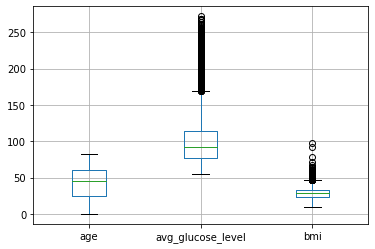

In [26]:
# boxplot of continuous features
bxplt = df1.iloc[:,[2,8,9]].boxplot()

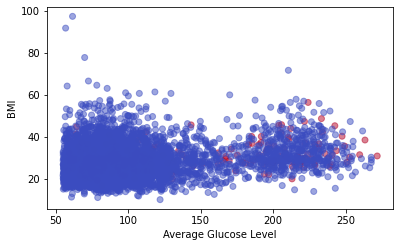

In [27]:
#plt.scatter(df1['avg_glucose_level'],df1['bmi'],c = df1['stroke'], cmap='cool', alpha=0.5)
#plt.xlabel="Glucose Level"

fig = plt.figure()
ax1 = fig.add_axes((0.1, 0.2, 0.8, 0.7))

#ax1.set_title("This is my title")
ax1.set_xlabel('Average Glucose Level')
ax1.set_ylabel('BMI')

# make the edge colors match the facecolors
ax1.scatter(df1['avg_glucose_level'],df1['bmi'],c = df1['stroke'], cmap='coolwarm', alpha=0.5)
#ax1.legend(labels=['avg_glucose_level', 'BMI'])
plt.show()

Feature id:



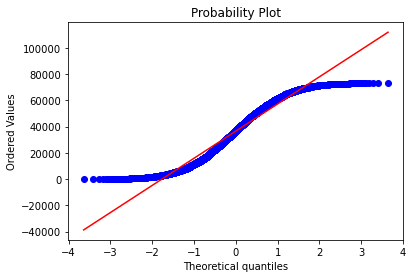

Feature gender:



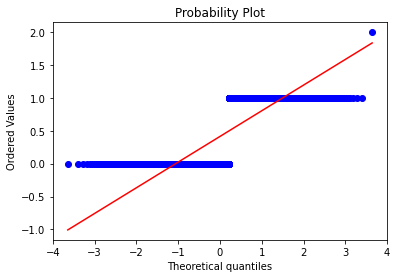

Feature age:



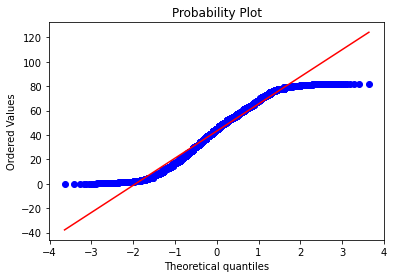

Feature hypertension:



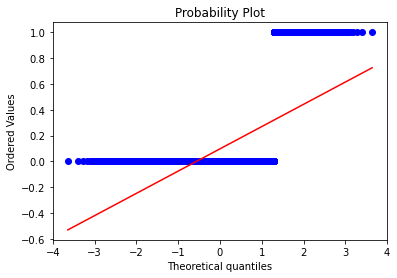

Feature heart_disease:



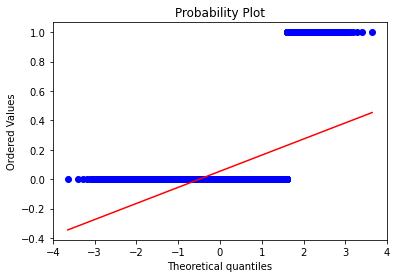

Feature ever_married:



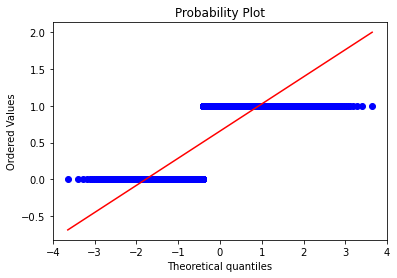

Feature work_type:



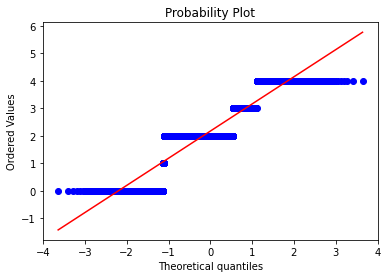

Feature Residence_type:



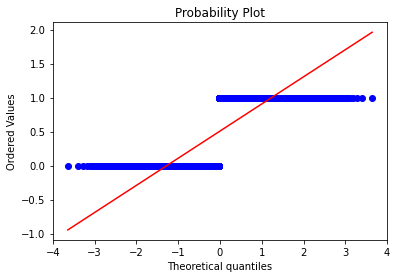

Feature avg_glucose_level:



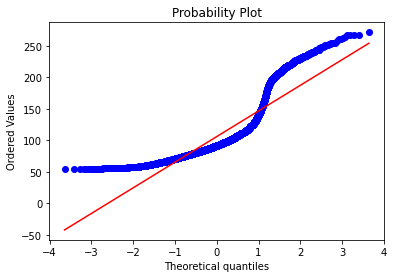

Feature bmi:



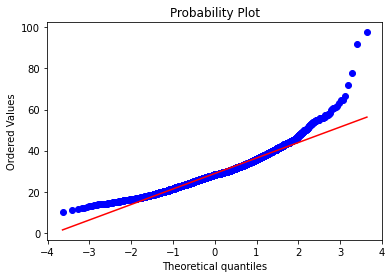

Feature smoking_status:



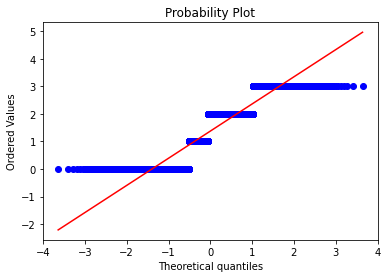

Feature stroke:



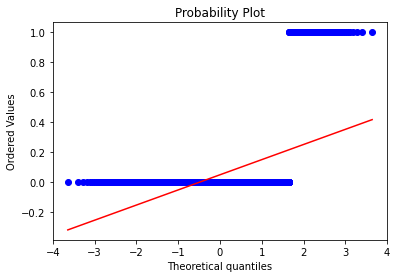

In [28]:
# Q-Q Plots for all features
for col in df1.columns:
    print("Feature {}:\n".format(col))
    scipy.stats.probplot(df1[col], dist="norm", plot=plt)
    plt.show()

In [29]:
from sklearn.ensemble import IsolationForest

# only consider metric columns
cols = [2,8,9]

columns_metric = df1.iloc[:,[2,8,9]]

outlier_detector = IsolationForest(n_estimators=500, random_state=13, contamination='auto')
outlier_detector.fit(columns_metric)
df1['outlier_mask'] = outlier_detector.predict(columns_metric)

In [30]:
df1['outlier_mask'].value_counts()

 1    3715
-1    1395
Name: outlier_mask, dtype: int64

### Plot functions

In [31]:
# prints the results
def printMetrics(classifiers, results):
    for nam, row in zip(classifiers, results):
        print('\n>>>', nam, '<<<')
        for metr, val in zip(metrics_names, row):
            print(metr, round((val), 3))

# bar graph of the results
def plotMetrics(classifiers, names, results):
    i = 0
    for name, clf in zip(names, classifiers):
        # make subplot
        ax = plt.subplot(1,len(classifiers),i+1)
        ax.bar(metrics_names, results[i,:],
              color=['#003f5c', '#7a5195', '#ef5675', '#ffa600'])
        ax.set_ylim(0.9, 1)
        ax.set_title(name, fontsize=20)
        i+=1
    # print figure    
    plt.rcParams["figure.figsize"] = (30,10)
    plt.show()

### Custom metrics functions

In [32]:
def accuracy(prediction, reference):
    correct = np.sum(prediction == reference)   
    return float(correct)/len(reference)

# number of labels might be > 2 in other cases
def precision(prediction,reference,label):
    tp = np.sum(prediction[reference == label] == reference[reference == label])
    fp = np.sum(prediction[reference != label] == label)
    return float(tp)/(tp+fp)

def recall(prediction,reference,label):
    tp = np.sum(prediction[reference == label] == reference[reference == label])
    fn = len(reference[reference == label]) - tp
    return float(tp)/(tp+fn)

def fscore(prediction,reference,label):
    prec = precision(prediction, reference, label)
    rec = recall(prediction, reference, label)
    return 2*(prec*rec)/(prec+rec)

### Main function, iterates over data splits and classifiers

In [33]:
def main(classifiers_, names_, splitter_, X_, y_):

    result = [] # will contain all metrics 2d arrays for each of the splits of the data
    conf_matrices = []
    
    # iterate over all stratified splits of the data
    for train_index, test_index in splitter_.split(X_, y_):
        X_train, X_test = X_[train_index], X_[test_index]
        y_train, y_test = y_[train_index], y_[test_index]
        #print(len(X_train), len(X_test), len(y_train), len(y_test))
        
        # counter
        i = 0

        # initialize and fill matrix / 2D-Array
        metrics = np.zeros(shape=(len(classifiers), len(metrics_names)), dtype=float)
        #conf_matrix = 

        # iterate all classifiers
        for clf in classifiers_:
          
            # fit classifier and make prediction
            clf.fit( X_train, y_train )
            pred = clf.predict(X_test)

            print(clf, "\n", confusion_matrix(pred, y_test))
            # calculate metrics and save to array
            metrics[i,0] = accuracy(pred, y_test)
            metrics[i,1] = precision(pred, y_test, 0)
            metrics[i,2] = recall(pred, y_test, 0)
            metrics[i,3] = fscore(pred, y_test, 0)
            i+=1
            
            #print(precision_score(y_test, pred))
            
            #conf_matrices.append((str(clf), confusion_matrix(pred, y_test)))

        # contains metrics table for each round of data split
        result.append(metrics) 

    # average cell wise across all 2d arrays in result list
    # -> puts all 2d arrays into 3d array and averages over new dimension
    output = np.stack(result).mean(axis=0) 

    # print and plot average results of data split across all classifiers
    plotMetrics(classifiers_, names_, output)
    printMetrics(names_,output)
    #print(conf_matrices.sort())

### Splitting data into training data and test data

In [34]:
# split data into lifestyle and medical variables
#lifestyle_columns = [1,2,5,6,7,10] # id, gender, ever_married, work_type, residence_type, smoking status
#medical_columns   = [3,4,8,9]  # id, gender, hypertension, heart_disease, avg_glucose_lvl, bmi
#all_columns       = [1,2,3,4,5,6,7,8,9,10]

# stratified split of the data
splitter = StratifiedShuffleSplit(n_splits=5, test_size=0.3, random_state=13)

# metrics used
metrics_names = ["Accuracy", "Precision", "Recall", "F-score"]

# list of classifiernames
#names = ["Nearest Neighbors", "LinearSVM", "DecisionTree_depth_none", "DecisionTree_depth_1", "DecisionTree_depth_5"]
names = ["Nearest Neighbors (7)", "DecisionTree_depth_5", "Neural Net", "SVC-rbf"]
# list of classifiers
#classifiers = [
#    KNeighborsClassifier(3),
#    SVC(kernel="linear", C=0.025), # C value taken from scikit-learn website, might play around with this
#    DecisionTreeClassifier(),
#    DecisionTreeClassifier(max_depth=1),
#    DecisionTreeClassifier(max_depth=5)
#    ]

classifiers = [
    KNeighborsClassifier(7),
    DecisionTreeClassifier(max_depth=5),
    MLPClassifier(alpha=1, max_iter=1000),
    SVC(kernel='rbf',gamma=2, C=1)
    ]



## ROC analysis

In [35]:
def main_KNN(X_, y_):

    X_train, X_test, y_train, y_test = train_test_split(X_, y_, test_size=.2, shuffle = True, random_state=13)
    
    classifier = KNeighborsClassifier(7)
    
    y_score = classifier.fit(X_train, y_train).predict_proba(X_test)[:,1]
    
    
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    fpr[0], tpr[0], _ = roc_curve(y_test, y_score)
    roc_auc[0] = auc(fpr[0], tpr[0])
    
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
       
    
    plt.figure(figsize=(8,8))
    plt.plot(fpr[0], tpr[0], color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc[0])
    plt.plot([0,1],[0,1], color = 'navy', lw=2, linestyle='--')
    plt.legend(loc="lower right")
    plt.show
    return (roc_auc[0],fscore(y_score, y_test, 1))

In [364]:
def main_DecTree(X_, y_):

    X_train, X_test, y_train, y_test = train_test_split(X_, y_, test_size=.2, shuffle = True, random_state=13)
    
    classifier = DecisionTreeClassifier(max_depth=5)
    
    y_score = classifier.fit(X_train, y_train).predict_proba(X_test)[:,1]
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    fpr[0], tpr[0], _ = roc_curve(y_test, y_score)
    roc_auc[0] = auc(fpr[0], tpr[0])
    
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    plt.figure(figsize=(8,8))
    plt.plot(fpr[0], tpr[0], color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc[0])
    plt.plot([0,1],[0,1], color = 'navy', lw=2, linestyle='--')
    plt.legend(loc="lower right")
    plt.show
    return (roc_auc[0],fscore(y_score,y_test,0))
    

### Split data into stroke + noStroke dataframes

In [38]:
df1_stroke = df1[df1['stroke'] == 1]
df1_noStroke = df1[df1['stroke'] == 0]
df2_stroke = df2[df2['stroke'] == 1]
df2_noStroke = df2[df2['stroke'] == 0]
df3_stroke = df3[df3['stroke'] == 1]
df3_noStroke = df3[df3['stroke'] == 0]

In [39]:
df1_stroke.shape, df1_noStroke.shape, df1.shape

((249, 13), (4861, 13), (5110, 13))

#### split into lifestyle / medical

In [170]:
#lifestyle_columns = [1,2,5,6,7,10] # age, gender, ever_married, work_type, residence_type, smoking status
lifestyle_columns = [1,5,6,7,10] # age, gender, ever_married, work_type, residence_type, smoking status
medical_columns   = [3,4,8,9]  # age, gender, hypertension, heart_disease, avg_glucose_lvl, bmi
#all_columns       = [1,2,3,4,5,6,7,8,9,10]
all_columns       = [2]

In [41]:
df1.iloc[:,0:12].corr(method='spearman').round(2)

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
id,1.00,0.00,0.00,0.00,-0.00,0.01,-0.02,-0.00,-0.05,0.01,0.01,0.01
gender,0.00,1.00,-0.02,0.02,0.09,-0.03,0.05,-0.01,0.05,0.01,-0.06,0.01
age,0.00,-0.02,1.00,0.28,0.27,0.66,-0.28,0.01,0.15,0.37,0.23,0.25
hypertension,0.00,0.02,0.28,1.00,0.11,0.16,-0.03,-0.01,0.11,0.17,0.11,0.13
heart_disease,-0.00,0.09,0.27,0.11,1.00,0.11,-0.02,0.00,0.11,0.07,0.05,0.13
ever_married,0.01,-0.03,0.66,0.16,0.11,1.00,-0.32,0.01,0.10,0.39,0.25,0.11
work_type,-0.02,0.05,-0.28,-0.03,-0.02,-0.32,1.00,-0.00,-0.02,-0.32,-0.30,-0.02
Residence_type,-0.00,-0.01,0.01,-0.01,0.00,0.01,-0.00,1.00,-0.01,0.00,0.01,0.02
avg_glucose_level,-0.05,0.05,0.15,0.11,0.11,0.10,-0.02,-0.01,1.00,0.11,0.04,0.08
bmi,0.01,0.01,0.37,0.17,0.07,0.39,-0.32,0.00,0.11,1.00,0.24,0.06


In [205]:
resLifestyle = [None] * 2
resLifestyle2 = [None] * 2

resMedical = [None] * 6
resMedical2 = [None] * 6

resAge = [None] * 2
resAge2 = [None] * 2

<ipython-input-32-b0e622e15444>:19: RuntimeWarning: invalid value encountered in double_scalars
  return 2*(prec*rec)/(prec+rec)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-35-a39adec03022>:22: Ru

median AUC: 0.601 

 median F1-score: 0.083


<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)


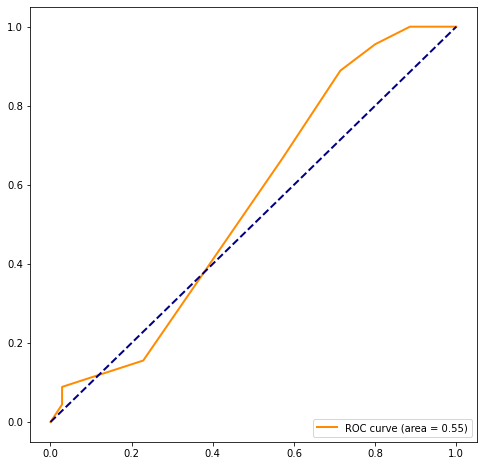

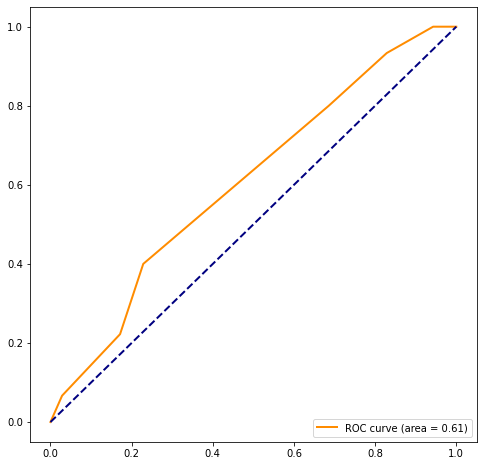

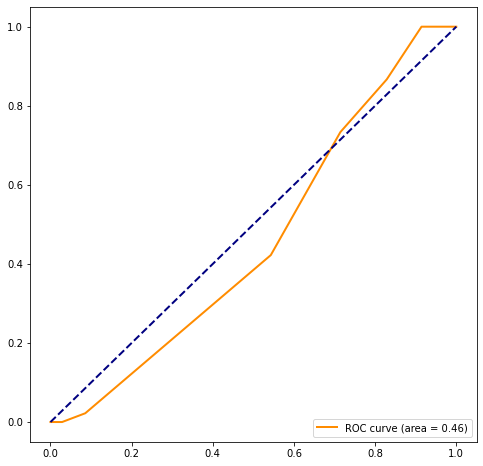

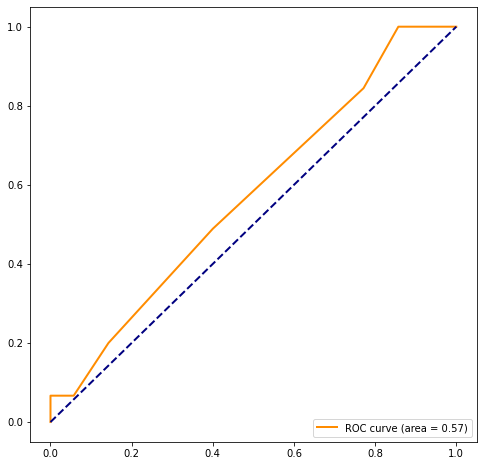

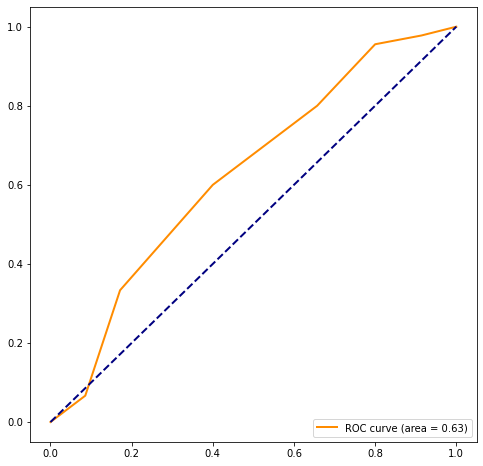

...

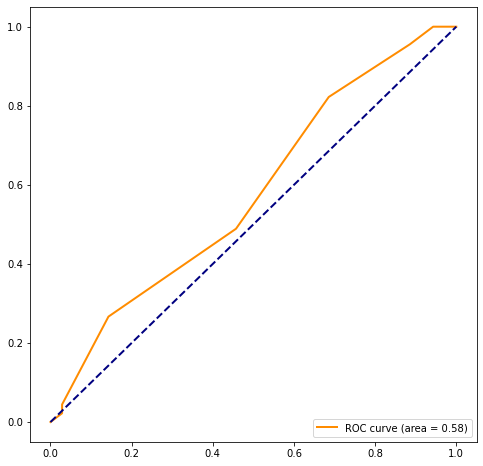

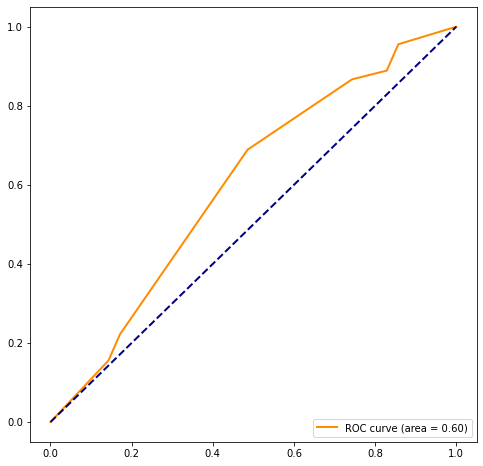

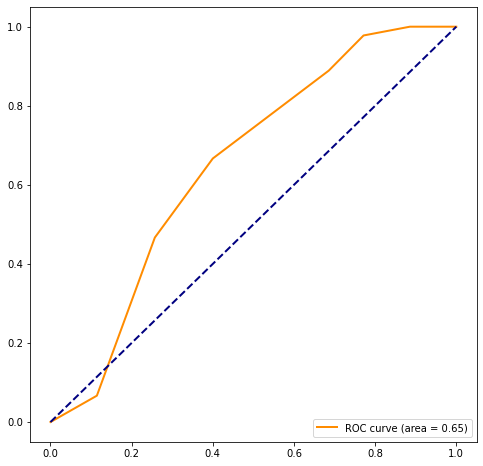

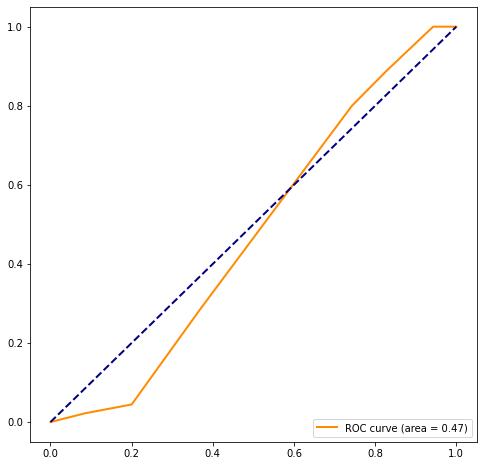

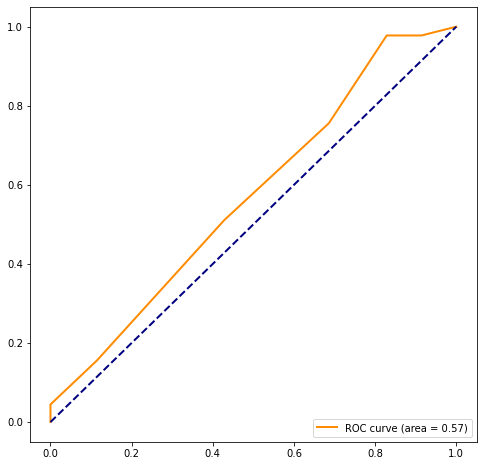

In [206]:
# 1)
# df1 -> custom imputation
# LIFESTYLE
# KNN

result = []

for i in range(0,50,1):

    customSample = df1_stroke.sample(n = 200).append(df1_noStroke.sample(n = 200))

    X = customSample.values[:,lifestyle_columns]
    y = customSample.values[:,11]

    result.append(main_KNN(X, y))    

# make list of two lists from list of tuples: [(,)] -> [[],[]]
res = list(map(list, zip(*result)))
    
print("median AUC:", round(sts.median(res[0]),3),
     "\n\n median F1-score:", round(np.nanmedian(res[1]),3))
resLifestyle[0] = (res[0])
resLifestyle2[0] = (res[1])

<ipython-input-364-83ab4435c49f>:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8,8))


median AUC: 0.634 

 median F1-score: 0.2


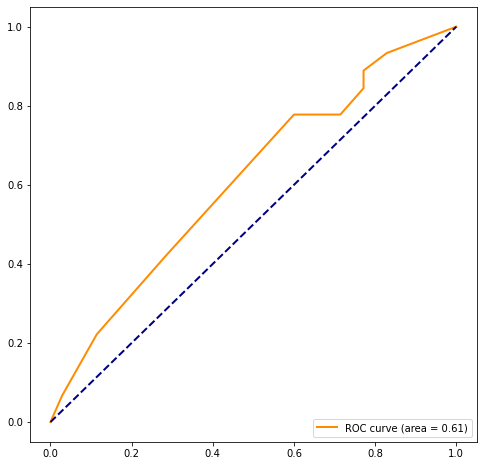

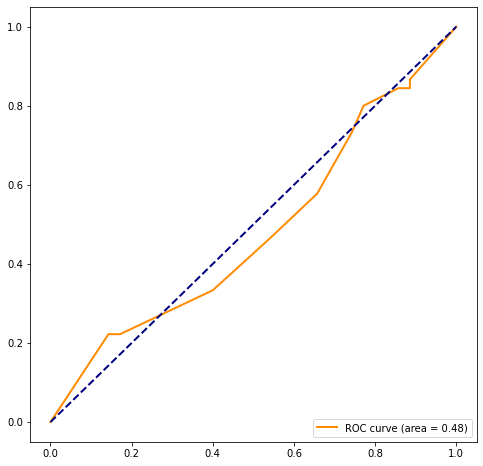

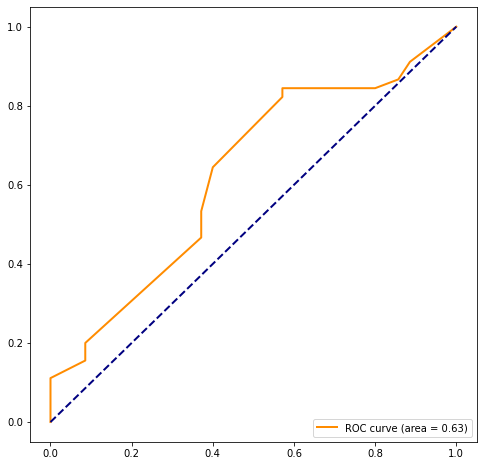

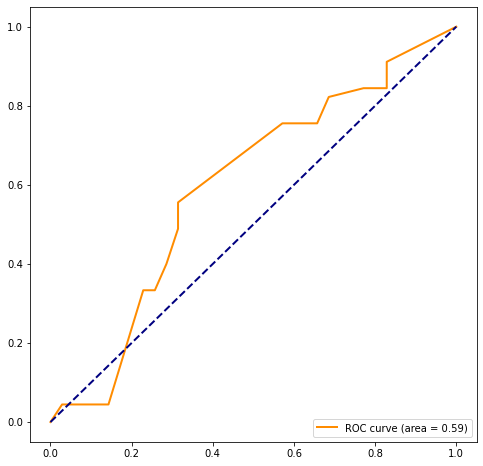

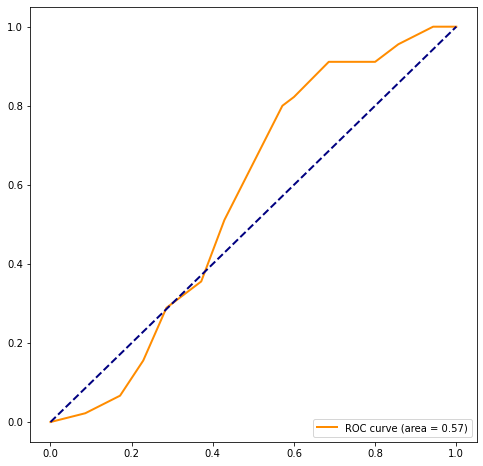

...

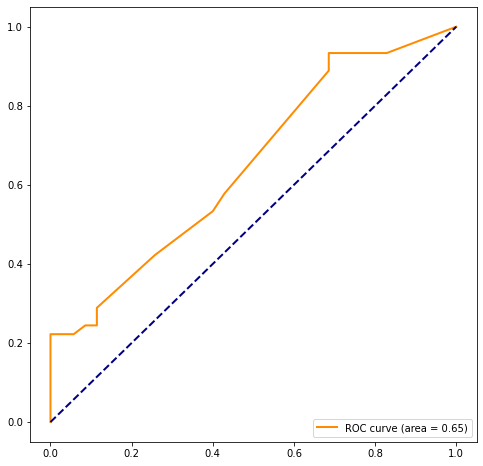

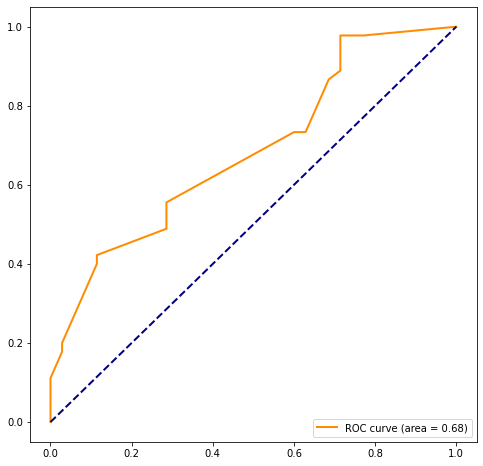

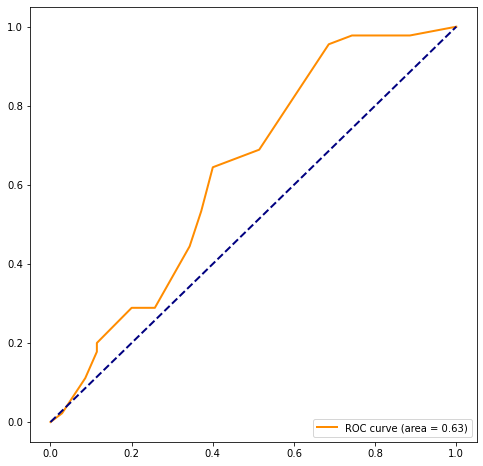

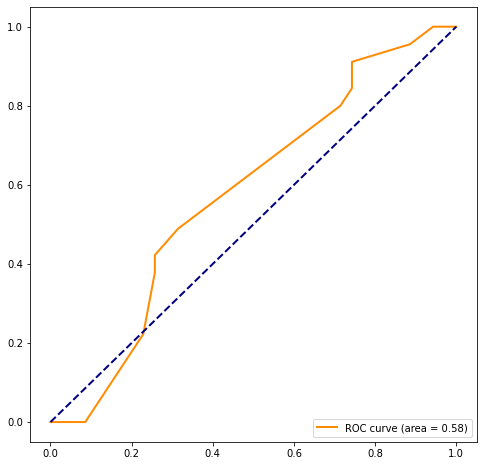

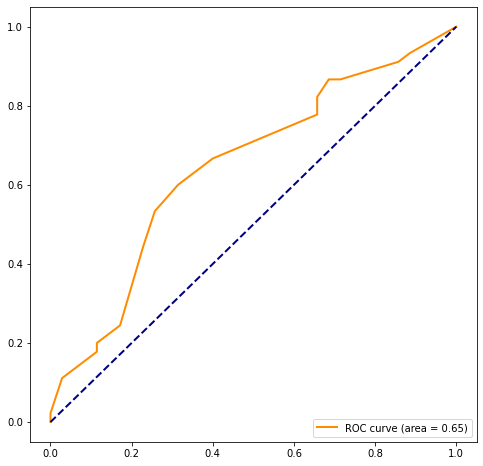

In [365]:
# 2)
# df1 -> custom imputation
# LIFESTYLE
# DecisionTree

result = []

for i in range(0,50,1):

    customSample = df1_stroke.sample(n = 200).append(df1_noStroke.sample(n = 200))

    X = customSample.values[:,lifestyle_columns]
    y = customSample.values[:,11]

    result.append(main_DecTree(X, y))

# make list of two lists from list of tuples: [(,)] -> [[],[]]
res = list(map(list, zip(*result)))
    
print("median AUC:", round(sts.median(res[0]),3),
     "\n\n median F1-score:", round(np.nanmedian(res[1]),3))
resLifestyle[1] = (res[0])
resLifestyle2[1] = (res[1])

<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-32-b0e622e15444>:19: RuntimeWarning: invalid value encountered in double_scalars
  return 2*(prec*rec)/(prec+rec)
<ipython-input-32-b0e622e15444>:19: RuntimeWarning: invalid value encountered in double_scalars
  return 2*(prec*rec)/(prec+rec)
<ipython-input-35-a39adec03022>:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8,8))
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: i

median AUC: 0.625 

 median F1-score: 0.085


<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)


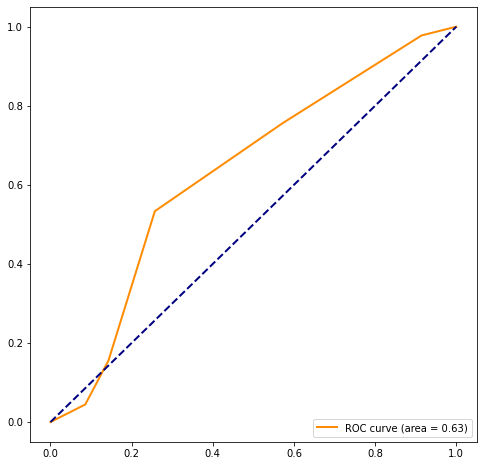

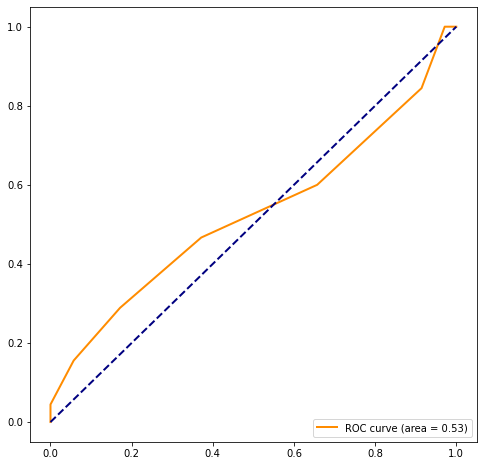

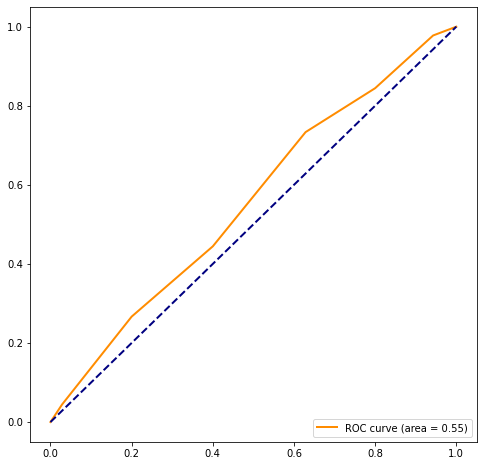

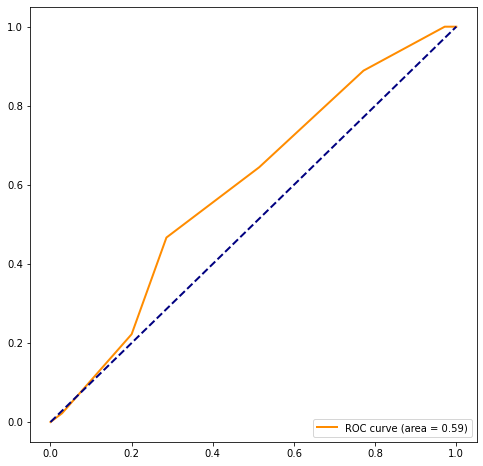

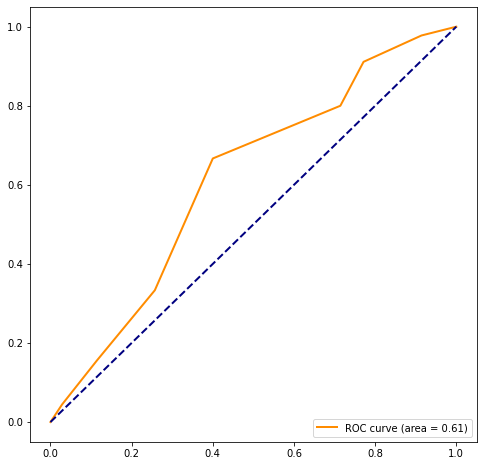

...

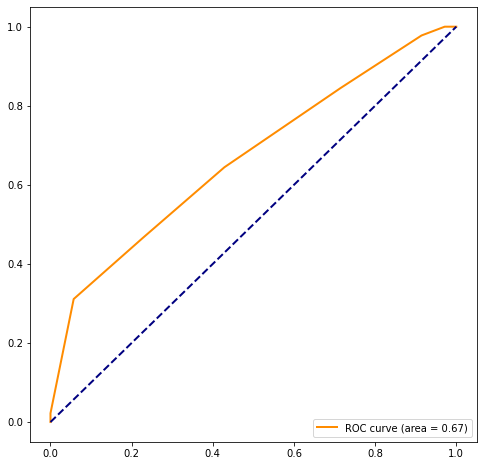

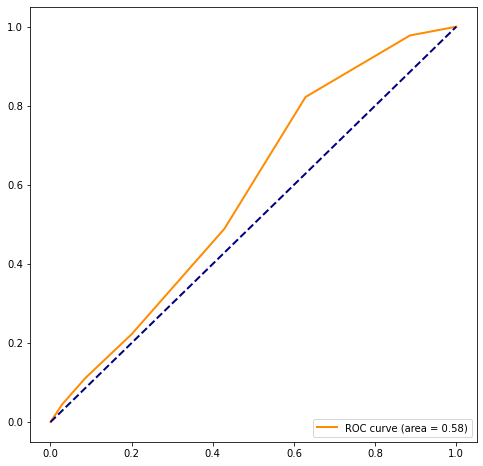

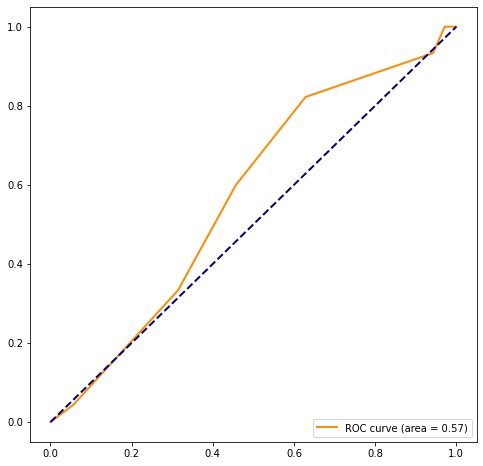

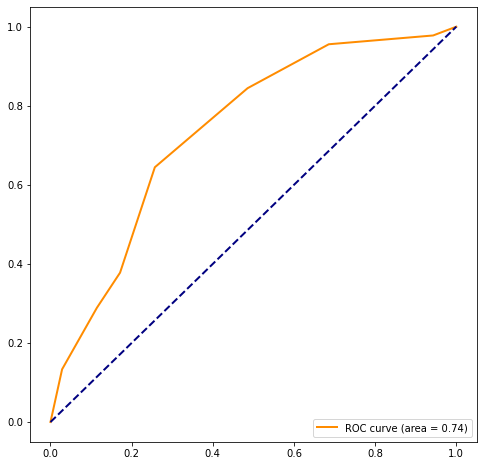

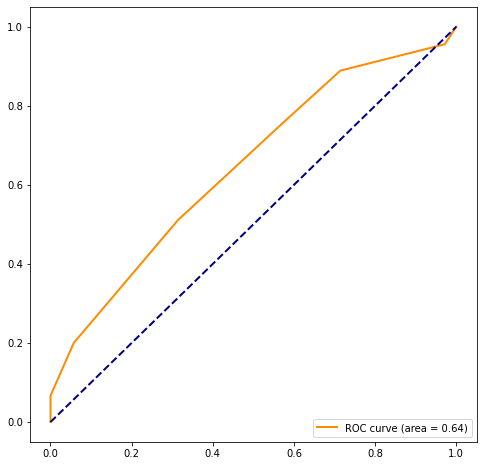

In [313]:
# 3)
# df1 -> custom imputation
# MEDICAL
# KNN

result = []

for i in range(0,50,1):

    customSample = df1_stroke.sample(n = 200).append(df1_noStroke.sample(n = 200))

    X = customSample.values[:,medical_columns]
    y = customSample.values[:,11]

    result.append(main_KNN(X, y))

# make list of two lists from list of tuples: [(,)] -> [[],[]]
res = list(map(list, zip(*result)))
    
print("median AUC:", round(sts.median(res[0]),3),
     "\n\n median F1-score:", round(np.nanmedian(res[1]),3))
resMedical[2] = (res[0])
resMedical2[2] = (res[1])

<ipython-input-32-b0e622e15444>:19: RuntimeWarning: invalid value encountered in double_scalars
  return 2*(prec*rec)/(prec+rec)
<ipython-input-364-83ab4435c49f>:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8,8))
<ipython-input-32-b0e622e15444>:19: RuntimeWarning: invalid value encountered in double_scalars
  return 2*(prec*rec)/(prec+rec)
<ipython-input-32-b0e622e15444>:19: RuntimeWarning: invalid value encountered in double_scalars
  return 2*(prec*rec)/(prec+rec)
<ipython-input-32-b0e622e15444>:19: RuntimeWarning: invalid value encountered in double_scalars
  return 2*(prec*rec)/(prec+rec)


median AUC: 0.657 

 median F1-score: 0.158


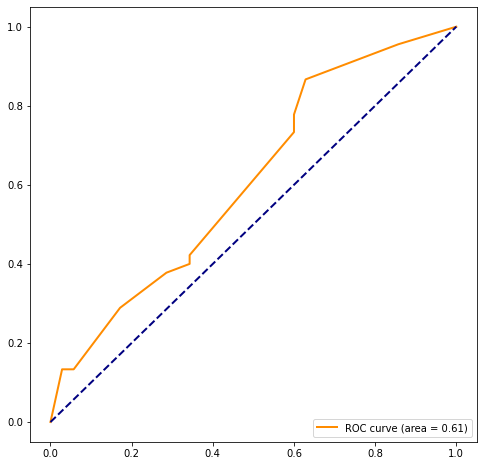

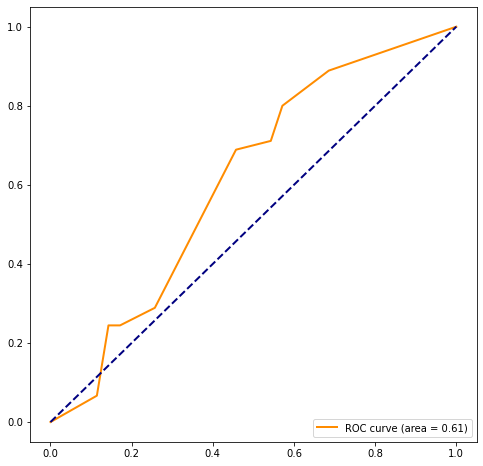

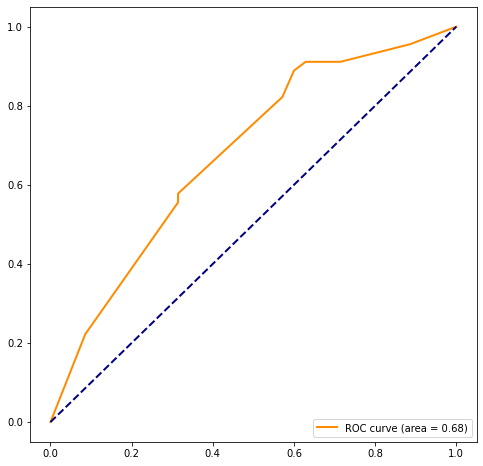

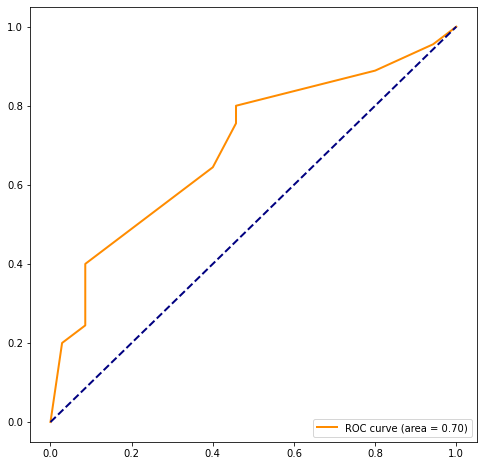

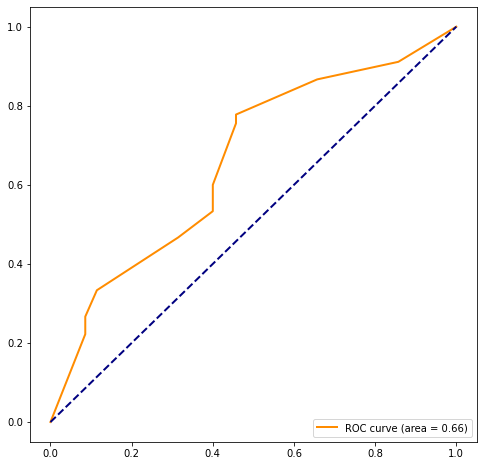

...

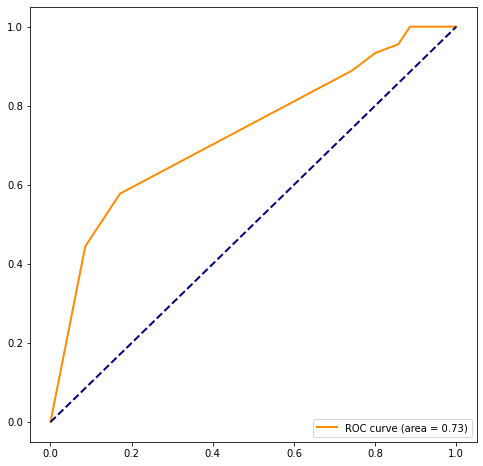

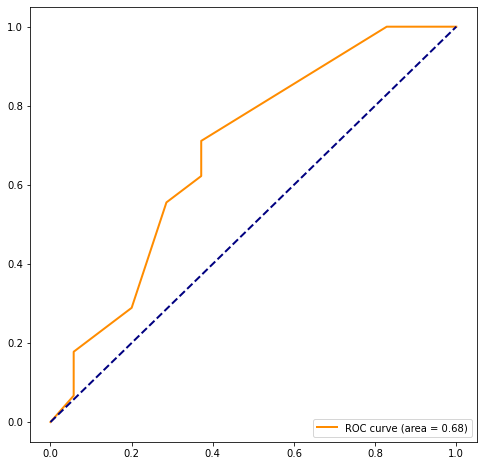

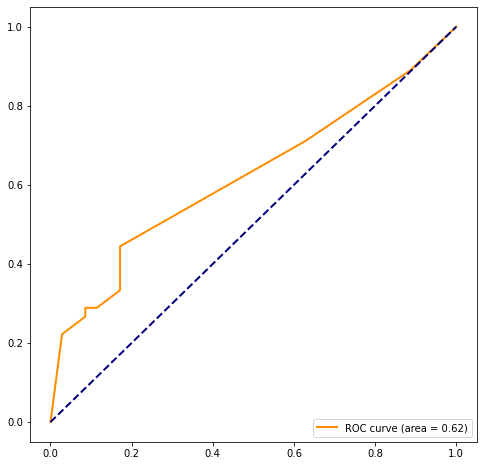

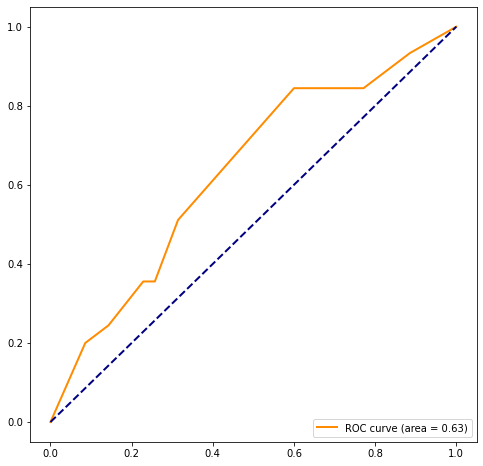

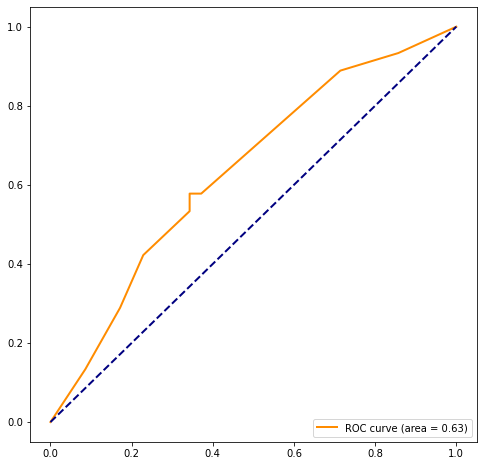

In [366]:
# 4)
# df1 -> custom imputation
# MEDICAL
# DecisionTree

result = []

for i in range(0,50,1):

    customSample = df1_stroke.sample(n = 200).append(df1_noStroke.sample(n = 200))

    X = customSample.values[:,medical_columns]
    y = customSample.values[:,11]

    result.append(main_DecTree(X, y))

# make list of two lists from list of tuples: [(,)] -> [[],[]]
res = list(map(list, zip(*result)))
    
print("median AUC:", round(sts.median(res[0]),3),
     "\n\n median F1-score:", round(np.nanmedian(res[1]),3))
resMedical[3] = (res[0])
resMedical2[3] = (res[1])

### DF 2 -> KNN Imputation

<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-35-a39adec03022>:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8,8))
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encount

median AUC: 0.653 

 median F1-score: 0.085


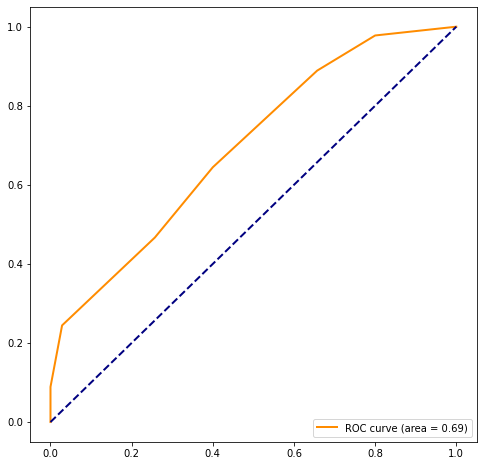

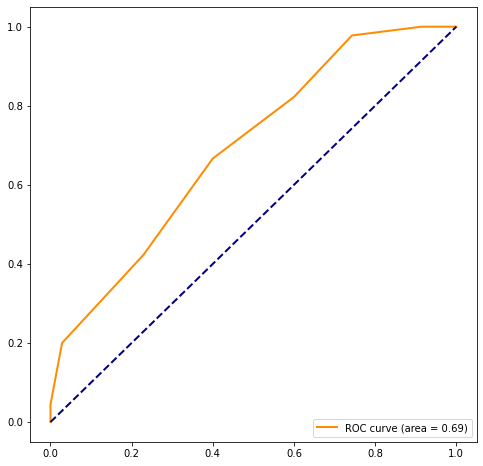

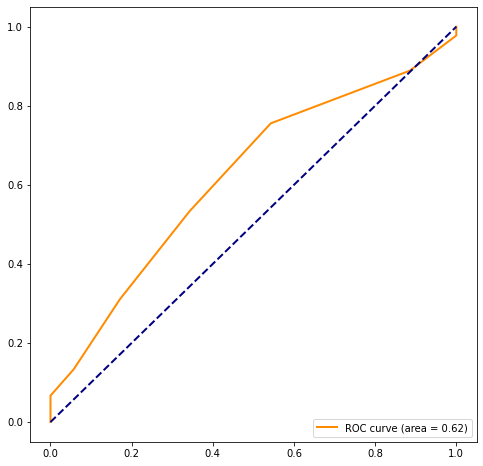

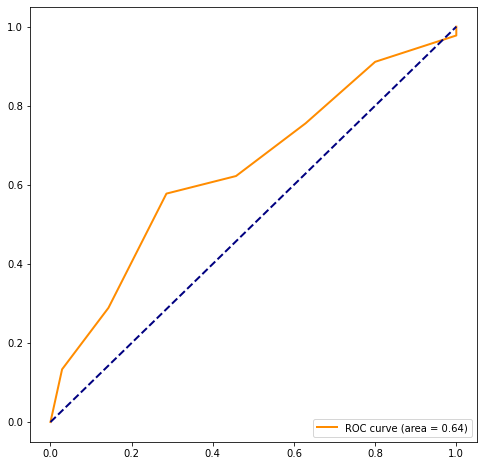

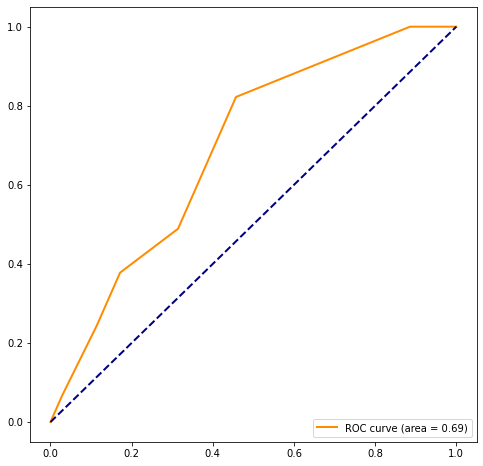

...

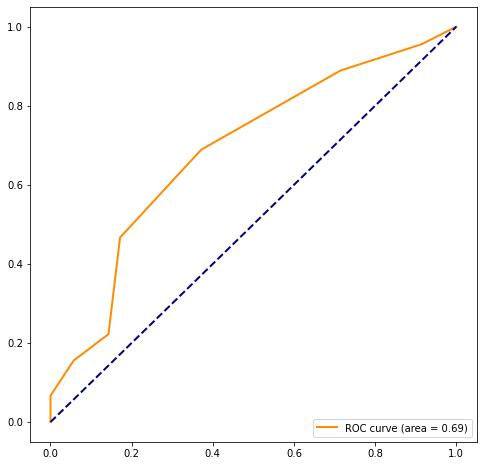

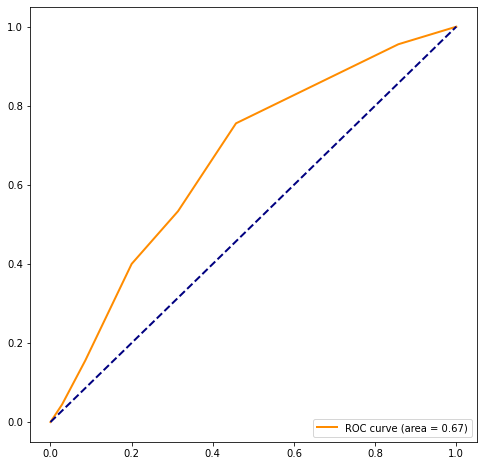

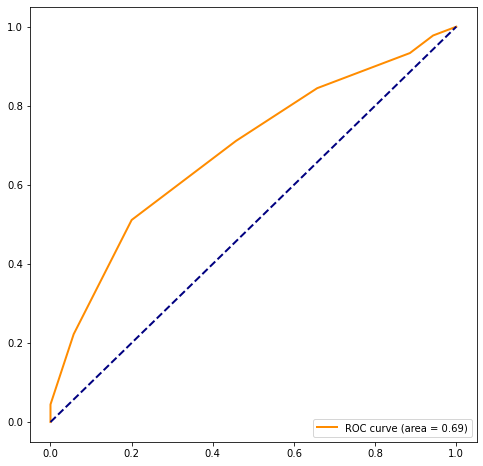

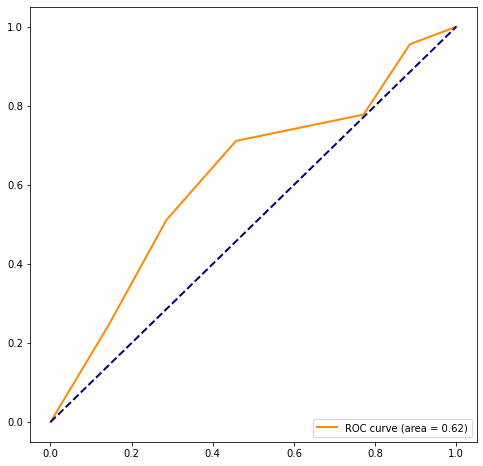

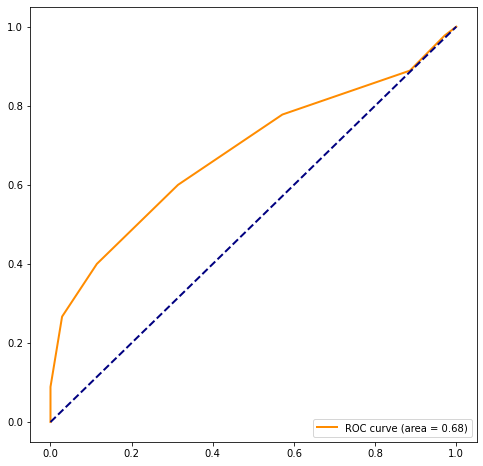

In [303]:
# 3)
# df2 -> KNN imputation
# MEDICAL
# KNN

result = []

for i in range(0,50,1):

    customSample = df2_stroke.sample(n = 200).append(df2_noStroke.sample(n = 200))

    X = customSample.values[:,medical_columns]
    y = customSample.values[:,11]

    result.append(main_KNN(X, y))

# make list of two lists from list of tuples: [(,)] -> [[],[]]
res = list(map(list, zip(*result)))
    
print("median AUC:", round(sts.median(res[0]),3),
     "\n\n median F1-score:", round(np.nanmedian(res[1]),3))
resMedical[4] = (res[0])
resMedical2[4] = (res[1])

In [304]:
# 4)
# df2 -> KNN imputation
# MEDICAL
# DecisionTree

result = []

for i in range(0,50,1):

    customSample = df2_stroke.sample(n = 200).append(df2_noStroke.sample(n = 200))

    X = customSample.values[:,medical_columns]
    y = customSample.values[:,11]

    result.append(main_DecTree(X, y))

# make list of two lists from list of tuples: [(,)] -> [[],[]]
res = list(map(list, zip(*result)))
    
print("median AUC:", round(sts.median(res[0]),3),
     "\n\n median F1-score:", round(np.nanmedian(res[1]),3))
resMedical[5] = (res[0])
resMedical2[5] = (res[1])

median AUC: 0.646 

 median F1-score: 0.186


<ipython-input-32-b0e622e15444>:19: RuntimeWarning: invalid value encountered in double_scalars
  return 2*(prec*rec)/(prec+rec)
<ipython-input-32-b0e622e15444>:19: RuntimeWarning: invalid value encountered in double_scalars
  return 2*(prec*rec)/(prec+rec)
<ipython-input-32-b0e622e15444>:19: RuntimeWarning: invalid value encountered in double_scalars
  return 2*(prec*rec)/(prec+rec)
<ipython-input-32-b0e622e15444>:19: RuntimeWarning: invalid value encountered in double_scalars
  return 2*(prec*rec)/(prec+rec)


### MEAN BMI imputation

<ipython-input-32-b0e622e15444>:19: RuntimeWarning: invalid value encountered in double_scalars
  return 2*(prec*rec)/(prec+rec)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-35-a39adec03022>:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8,8))
<ipython-input-32-b0e622e15444>:19: RuntimeWarning: invalid value encountered in double_scalars
  return 2*(prec*rec)/(prec+rec)
<ipython-input-32-b0e622e15444>:19: RuntimeWarning: 

median AUC: 0.603 

 median F1-score: 0.124


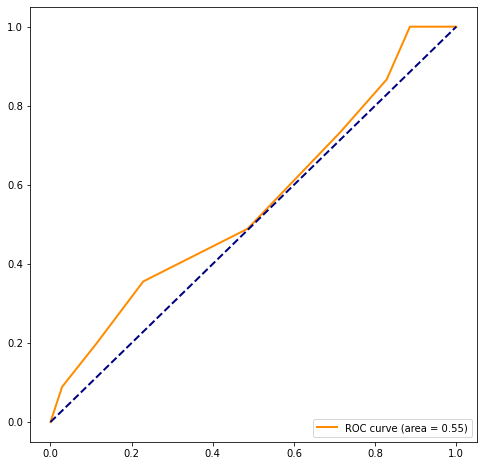

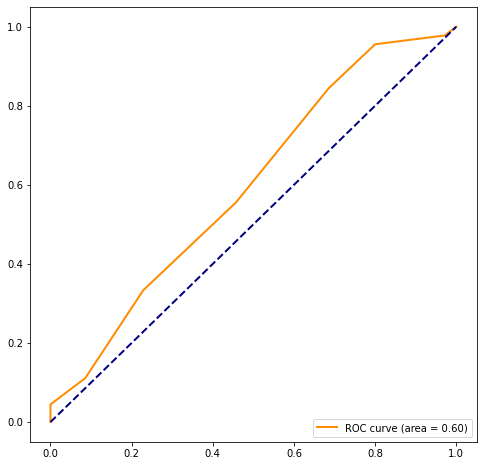

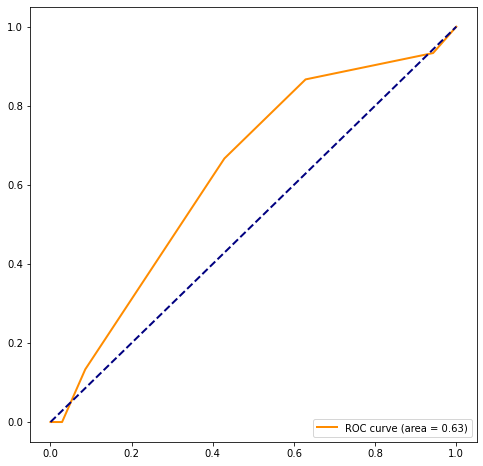

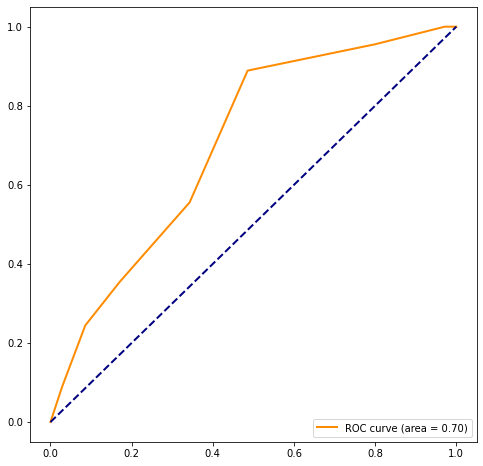

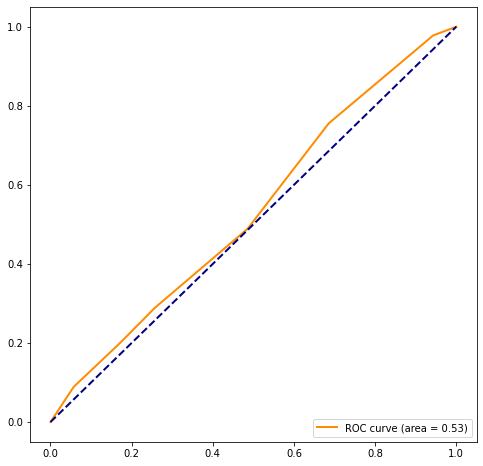

...

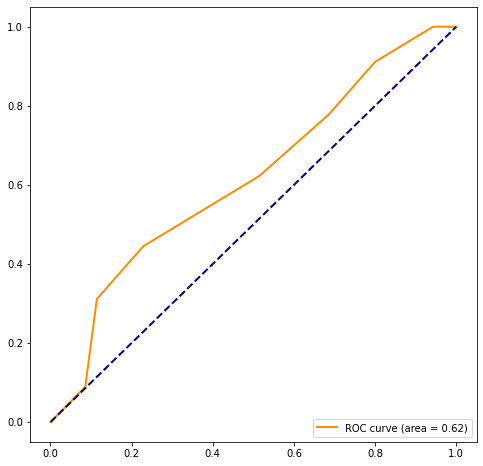

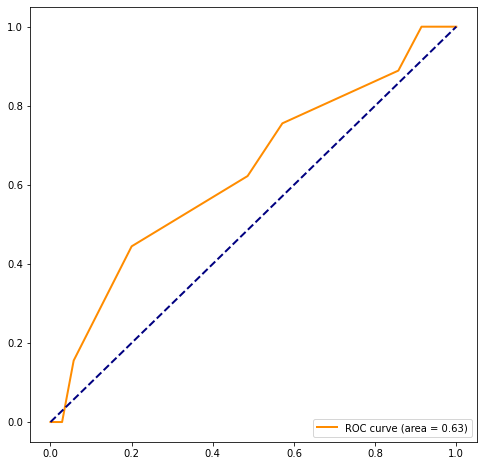

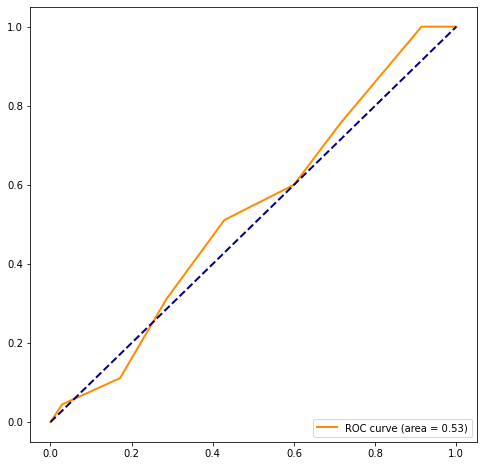

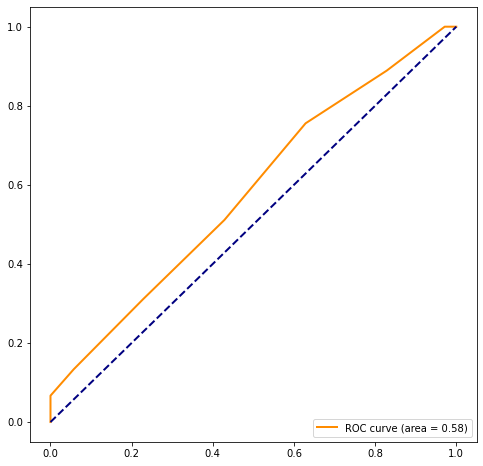

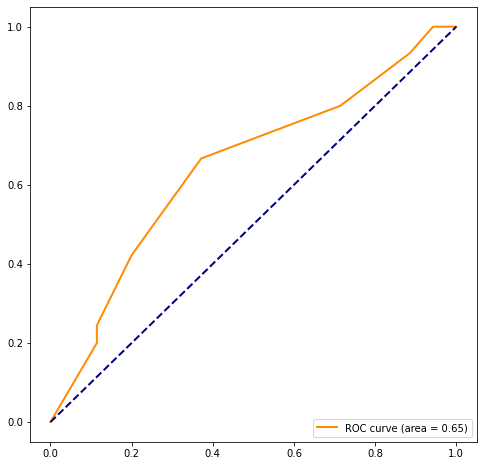

In [305]:
# 3)
# df3 -> mean imputation
# MEDICAL
# KNN

result = []

for i in range(0,50,1):

    customSample = df3_stroke.sample(n = 200).append(df3_noStroke.sample(n = 200))

    X = customSample.values[:,medical_columns]
    y = customSample.values[:,11]

    result.append(main_KNN(X, y))

# make list of two lists from list of tuples: [(,)] -> [[],[]]
res = list(map(list, zip(*result)))
    
#print("mean AUC:", round(sts.mean(res[0]),3), "SD:", round(sts.stdev(res[0]),3),
#     "\n\n mean F1-score:", round(np.nanmean(res[1]),3),round(np.nanstd(res[1]),3))

print("median AUC:", round(sts.median(res[0]),3),
     "\n\n median F1-score:", round(np.nanmedian(res[1]),3))
resMedical[0] = (res[0])
resMedical2[0] = (res[1])

In [306]:
# 4)
# df3 -> mean imputation
# MEDICAL
# DecisionTree

result = []

for i in range(0,50,1):

    customSample = df3_stroke.sample(n = 200).append(df3_noStroke.sample(n = 200))

    X = customSample.values[:,medical_columns]
    y = customSample.values[:,11]

    result.append(main_DecTree(X, y))

# make list of two lists from list of tuples: [(,)] -> [[],[]]
res = list(map(list, zip(*result)))
    
print("median AUC:", round(sts.median(res[0]),3),
     "\n\n median F1-score:", round(np.nanmedian(res[1]),3))
resMedical[1] = (res[0])
resMedical2[1] = (res[1])

median AUC: 0.646 

 median F1-score: 0.146


<ipython-input-32-b0e622e15444>:19: RuntimeWarning: invalid value encountered in double_scalars
  return 2*(prec*rec)/(prec+rec)


### Age

<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)
<ipython-input-35-a39adec03022>:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8,8))
<ipython-input-32-b0e622e15444>:19: RuntimeWarning: invalid value encountered in double_scalars
  return 2*(prec*rec)/(prec+rec)
<ipython-input-32-b0e622e15444>:9: RuntimeWarning: invalid value encountered in true_divide
  return float(tp)/(tp+fp)


median AUC: 0.801 

 median F1-score: 0.25


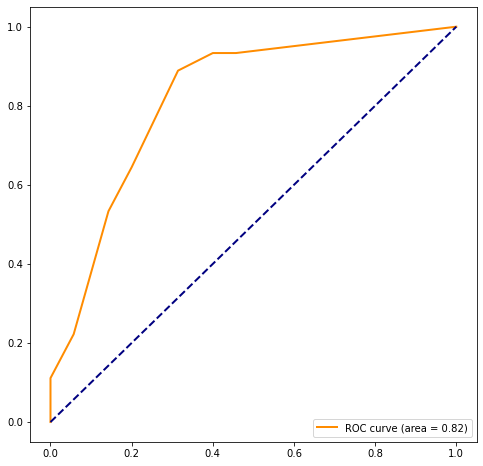

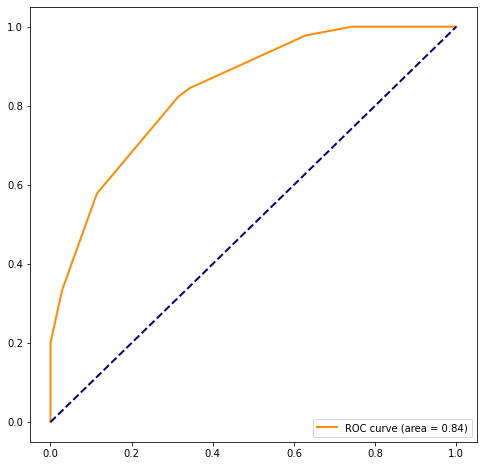

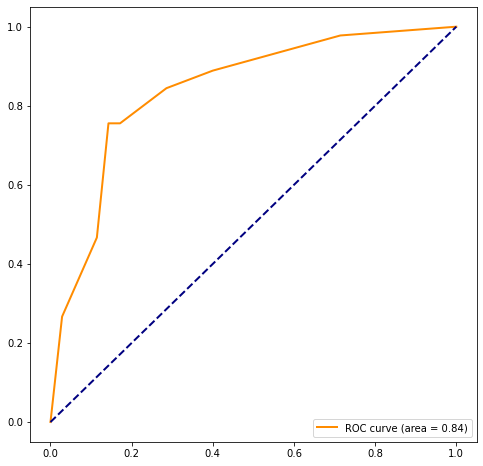

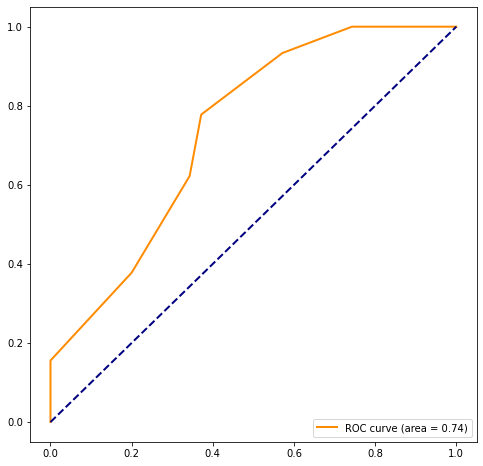

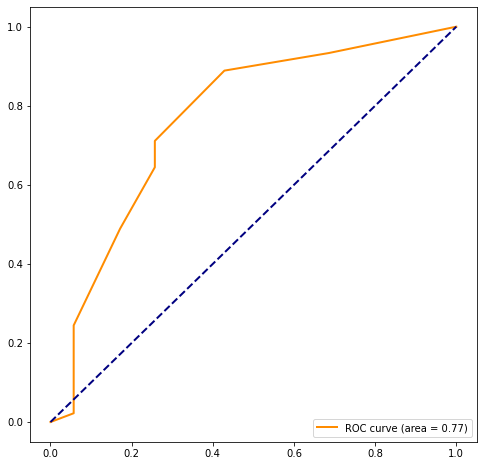

...

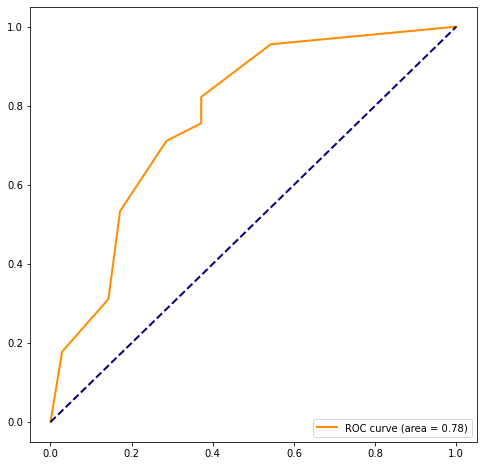

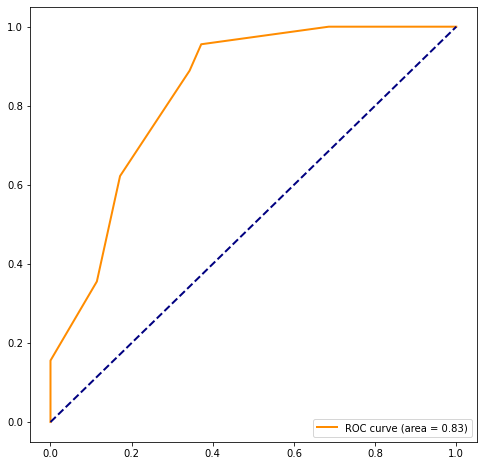

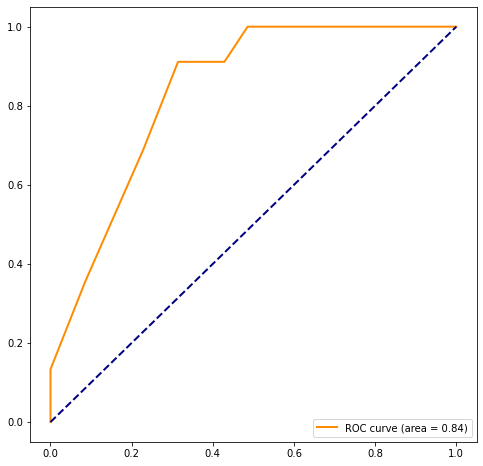

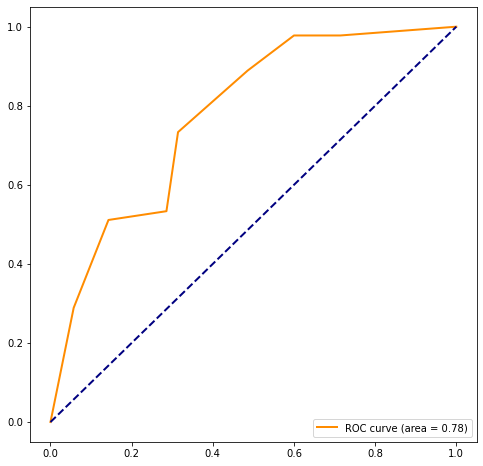

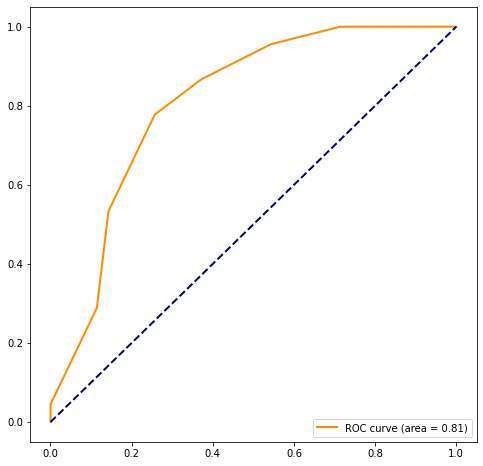

In [307]:
# 5)
# df1 -> custom imputation
# AGE
# KNN

result = []

for i in range(0,50,1):

    customSample = df1_stroke.sample(n = 200).append(df1_noStroke.sample(n = 200))

    X = customSample.values[:,all_columns]
    y = customSample.values[:,11]

    result.append(main_KNN(X, y))

# make list of two lists from list of tuples: [(,)] -> [[],[]]
res = list(map(list, zip(*result)))
    
print("median AUC:", round(sts.median(res[0]),3),
     "\n\n median F1-score:", round(np.nanmedian(res[1]),3))
resAge[0] = (res[0])
resAge2[0] = (res[1])

In [215]:
# 6)
# df1 -> custom imputation
# Age
# DecisionTree

result = []

for i in range(0,50,1):

    customSample = df1_stroke.sample(n = 200).append(df1_noStroke.sample(n = 200))

    X = customSample.values[:,all_columns]
    y = customSample.values[:,11]

    result.append(main_DecTree(X, y))

# make list of two lists from list of tuples: [(,)] -> [[],[]]
res = list(map(list, zip(*result)))
    
print("median AUC:", round(sts.median(res[0]),3),
     "\n\n median F1-score:", round(np.nanmedian(res[1]),3))
resAge[1] = (res[0])
resAge2[1] = (res[1])

median AUC: 0.804 

 median F1-score: 0.545


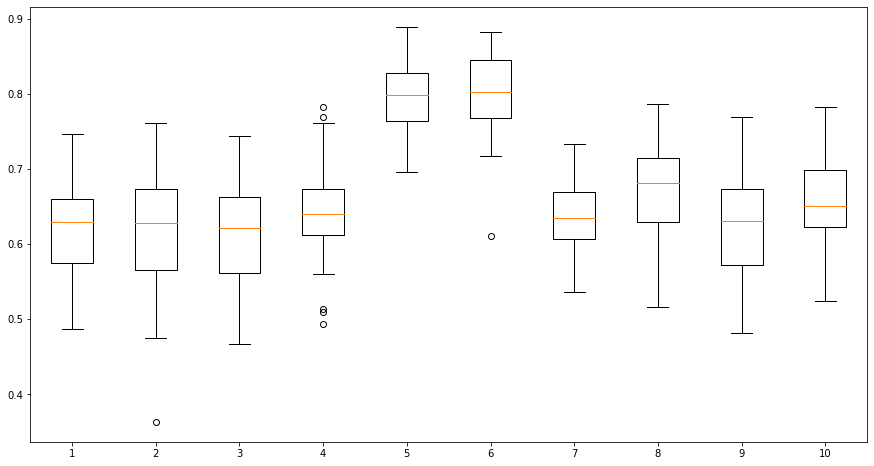

In [216]:
fig, ax = plt.subplots(figsize=(15,8))
plt.boxplot(boxplotvector)
plt.show()

In [315]:
import math

# remove nan from all lists - i got no time edition .....

resLifestyle[0] = [x for x in resLifestyle[0] if math.isnan(x) == False]
resLifestyle[1] = [x for x in resLifestyle[1] if math.isnan(x) == False]

resLifestyle2[0] = [x for x in resLifestyle2[0] if math.isnan(x) == False]
resLifestyle2[1] = [x for x in resLifestyle2[1] if math.isnan(x) == False]

resMedical[0] = [x for x in resMedical[0] if math.isnan(x) == False]
resMedical[1] = [x for x in resMedical[1] if math.isnan(x) == False]
resMedical[2] = [x for x in resMedical[2] if math.isnan(x) == False]
resMedical[3] = [x for x in resMedical[3] if math.isnan(x) == False]
resMedical[4] = [x for x in resMedical[4] if math.isnan(x) == False]
resMedical[5] = [x for x in resMedical[5] if math.isnan(x) == False]

resMedical2[0] = [x for x in resMedical2[0] if math.isnan(x) == False]
resMedical2[1] = [x for x in resMedical2[1] if math.isnan(x) == False]
resMedical2[2] = [x for x in resMedical2[2] if math.isnan(x) == False]
resMedical2[3] = [x for x in resMedical2[3] if math.isnan(x) == False]
resMedical2[4] = [x for x in resMedical2[4] if math.isnan(x) == False]
resMedical2[5] = [x for x in resMedical2[5] if math.isnan(x) == False]

resAge[0] = [x for x in resAge[0] if math.isnan(x) == False]
resAge[1] = [x for x in resAge[1] if math.isnan(x) == False]

resAge2[0] = [x for x in resAge2[0] if math.isnan(x) == False]
resAge2[1] = [x for x in resAge2[1] if math.isnan(x) == False]

In [360]:
np.median(resLifestyle[1])

0.6101587301587301

In [362]:
np.median(resAge[0])

0.8007936507936508

In [358]:
np.median(resMedical2[3])

0.19047619047619044

In [359]:
np.median(resAge[0]),np.median(resAge[1])

(0.8007936507936508, 0.8038095238095239)

In [ ]:
resAge2

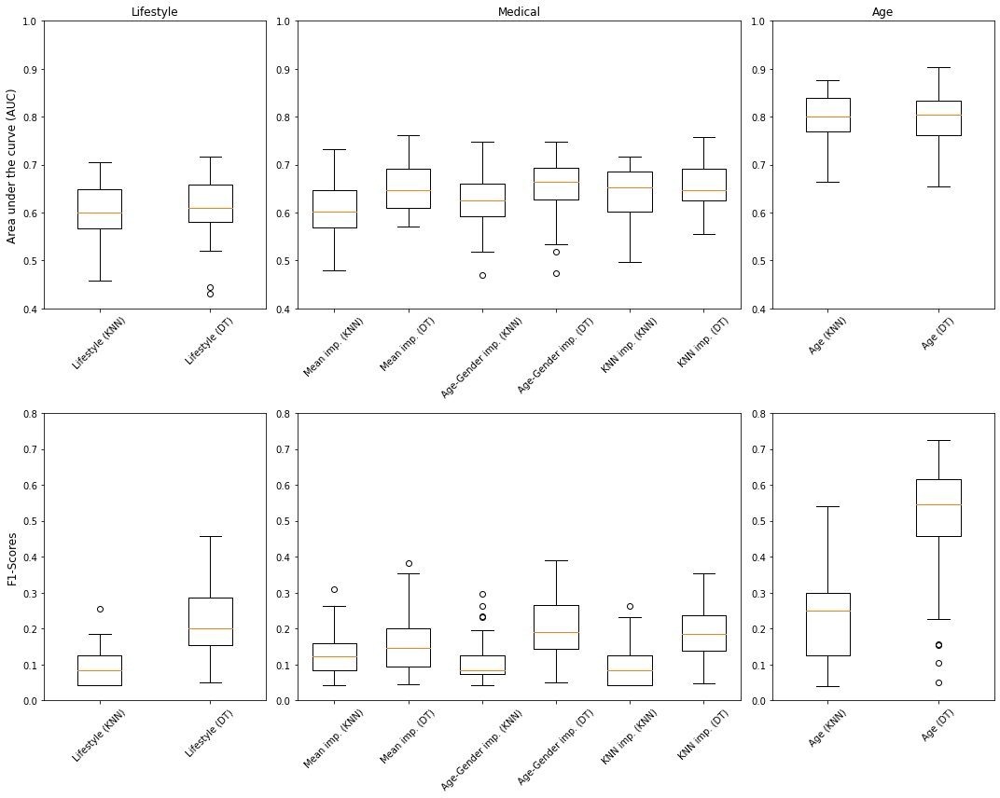

In [344]:
fig, ax = plt.subplots(2,3, gridspec_kw={'width_ratios': [1, 2, 1]},figsize=(15,12))

# AUC VALUES
ax[0, 0].boxplot(resLifestyle, widths=(0.4, 0.4)) # hier aendern
ax[0, 0].set_title('Lifestyle')
ax[0, 0].set_ylim([0.4, 1])
ax[0, 0].set_ylabel('Area under the curve (AUC)', fontsize=12)
ax[0, 0].set_xticklabels(['Lifestyle (KNN)', 'Lifestyle (DT)'], fontdict=None, minor=False, rotation=45)

ax[0, 1].boxplot(resMedical, widths=(0.6, 0.6,0.6, 0.6,0.6, 0.6))
ax[0, 1].set_title('Medical')
ax[0, 1].set_ylim([0.4, 1])
ax[0, 1].set_xticklabels(['Mean imp. (KNN)', 'Mean imp. (DT)','Age-Gender imp. (KNN)', 'Age-Gender imp. (DT)','KNN imp. (KNN)', 'KNN imp. (DT)'], fontdict=None, minor=False, rotation=45)

ax[0, 2].boxplot(resAge, widths=(0.4, 0.4))
ax[0, 2].set_title('Age')
ax[0, 2].set_ylim([0.4, 1])
ax[0, 2].set_xticklabels(['Age (KNN)', 'Age (DT)'], fontdict=None, minor=False, rotation=45)

# F-Scores
ax[1, 0].boxplot(resLifestyle2, widths=(0.4, 0.4))
ax[1, 0].set_ylim([0, 0.8])
ax[1, 0].set_ylabel('F1-Scores', fontsize=12)
ax[1, 0].set_xticklabels(['Lifestyle (KNN)', 'Lifestyle (DT)'], fontdict=None, minor=False, rotation=45)

ax[1, 1].boxplot(resMedical2, widths=(0.6, 0.6,0.6, 0.6,0.6, 0.6))
ax[1, 1].set_xticklabels(['Mean imp. (KNN)', 'Mean imp. (DT)','Age-Gender imp. (KNN)', 'Age-Gender imp. (DT)','KNN imp. (KNN)', 'KNN imp. (DT)'], fontdict=None, minor=False, rotation=45)
ax[1, 1].set_ylim([0, 0.8])

ax[1, 2].boxplot(resAge2, widths=(0.4, 0.4))
ax[1, 2].set_ylim([0, 0.8])
ax[1, 2].set_xticklabels(['Age (KNN)', 'Age (DT)'], fontdict=None, minor=False, rotation=45)


#plt.boxplot(newlist)
#plt.boxplot(boxplotvector)
plt.tight_layout()
plt.show()
fig.savefig('boxplots.pdf')

## Plot Bar with Error

In [52]:
mean_values = [0.632, 0.642, 0.604,0.63, 0.809]
error = [0.039, 0.05,0.058,0.06, 0.026]

colors = ['#003f5c','#003f5c','#003f5c','#003f5c','#003f5c']

In [1669]:
features = ['Lifestyle','Medical-1', 'Medical-2','Medical-3','Age']
x_pos = np.arange(len(features))

<function matplotlib.pyplot.show(close=None, block=None)>

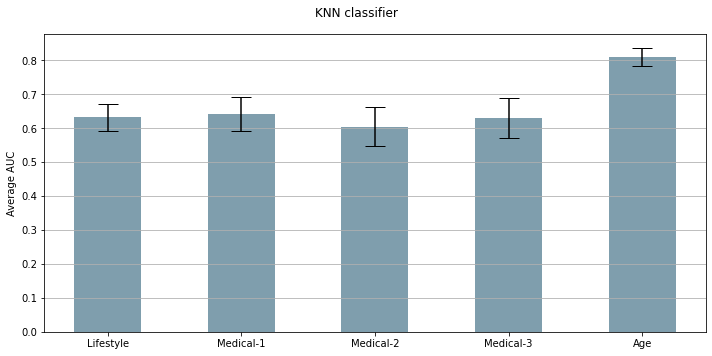

In [1679]:
fig, ax = plt.subplots(figsize=(10,5))
ax.bar(x_pos, mean_values, yerr=error, align = 'center', alpha = 0.5, color = colors, capsize = 10, width=0.5)
fig.suptitle('KNN classifier')
ax.set_xticks(x_pos)
ax.set_xticklabels(features)
plt.ylabel('Average AUC')
ax.yaxis.grid(True)
plt.tight_layout()
plt.show



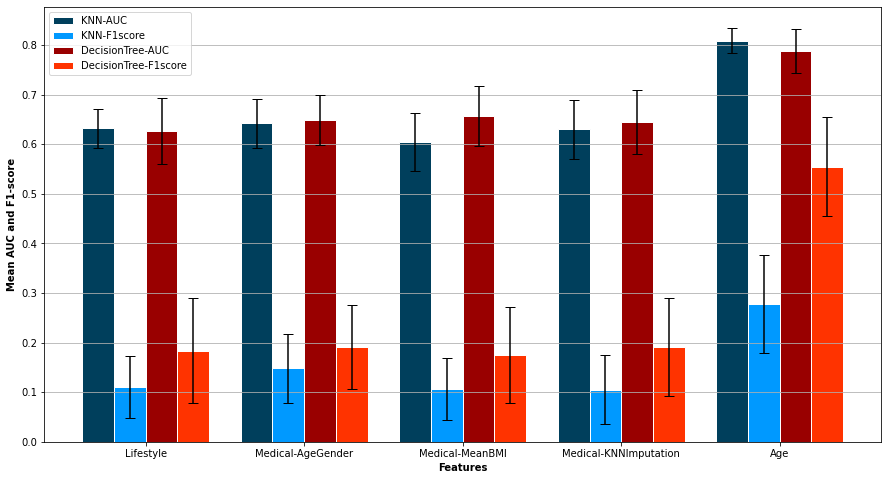

In [1737]:
# https://www.python-graph-gallery.com/11-grouped-barplot

# set width of bars
barWidth = 0.2
 
# set heights of bars
# KNN AUC
bars1  = [0.632, 0.642, 0.604, 0.63, 0.809]
error1 = [0.039, 0.05,0.058,0.06, 0.026]

# KNN F1
bars2  = [0.11, 0.148, 0.106, 0.105, 0.278]
error2 = [0.063,0.069,0.062,0.069,0.098]

# DecTree AUC
bars3  = [0.627, 0.649, 0.657, 0.645, 0.788]
error3 = [0.067, 0.051, 0.061, 0.065, 0.045]

# DecTree F1
bars4  = [0.184, 0.191, 0.175, 0.191, 0.555]
error4 = [0.106, 0.084, 0.097, 0.098, 0.099]


fig, ax = plt.subplots(figsize=(15,8))
    
# Set position of bar on X axis
r1 = np.arange(len(bars1))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]

# Make the plot
plt.bar(r1, bars1, color='#003f5c', width=barWidth, yerr=error1, edgecolor='white', label='KNN-AUC', capsize=5)
plt.bar(r2, bars2, color='#0099ff', width=barWidth, yerr=error2, edgecolor='white', label='KNN-F1score', capsize=5)
plt.bar(r3, bars3, color='#990000', width=barWidth, yerr=error3, edgecolor='white', label='DecisionTree-AUC', capsize=5)
plt.bar(r4, bars4, color='#ff3300', width=barWidth, yerr=error4, edgecolor='white', label='DecisionTree-F1score', capsize=5)
 
# Add xticks on the middle of the group bars

plt.xlabel('Features', fontweight='bold')
plt.xticks([r + barWidth+0.1 for r in range(len(bars1))], ['Lifestyle', 'Medical-AgeGender', 'Medical-MeanBMI', 'Medical-KNNImputation', 'Age'])
plt.ylabel('Mean AUC and F1-score', fontweight='bold')

ax.yaxis.grid(True)
 
# Create legend & Show graphic
plt.legend()
plt.show()

### NOW: PLOT MEDIAN INSTEAD OF MEAN

# OLD STUFF:

## Run all configurations:

# 1) 
### - lifestyle features
### - custom BMI imputation by gender and age


KNeighborsClassifier(n_neighbors=7) 
 [[972  50]
 [  0   0]]
DecisionTreeClassifier(max_depth=5) 
 [[972  50]
 [  0   0]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[967  48]
 [  5   2]]
KNeighborsClassifier(n_neighbors=7) 
 [[972  50]
 [  0   0]]
DecisionTreeClassifier(max_depth=5) 
 [[972  50]
 [  0   0]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[968  50]
 [  4   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[969  48]
 [  3   2]]
DecisionTreeClassifier(max_depth=5) 
 [[972  50]
 [  0   0]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[966  49]
 [  6   1]]
KNeighborsClassifier(n_neighbors=7) 
 [[968  50]
 [  4   0]]
DecisionTreeClassifier(max_depth=5) 
 [[970  49]
 [  2   1]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[963  48]
 [  9   2]]
KNeighborsClassifier(n_neighbors=7) 
 [[971  48]
 [  1   2]]
DecisionTreeClassifier(max_

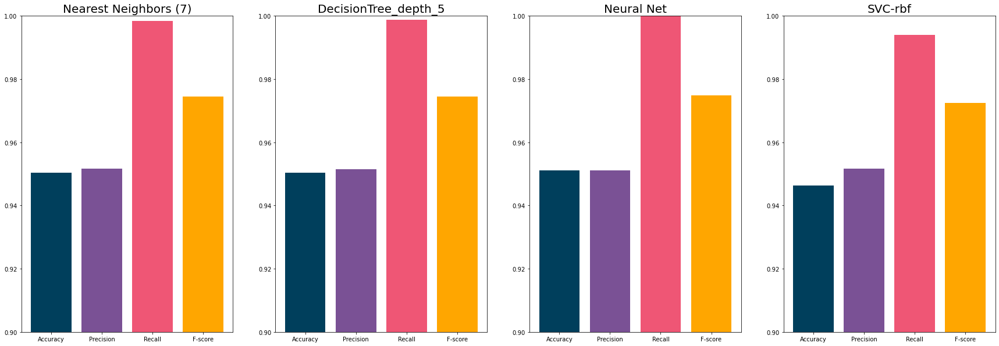


>>> Nearest Neighbors (7) <<<
Accuracy 0.95
Precision 0.952
Recall 0.998
F-score 0.974

>>> DecisionTree_depth_5 <<<
Accuracy 0.95
Precision 0.951
Recall 0.999
F-score 0.975

>>> Neural Net <<<
Accuracy 0.951
Precision 0.951
Recall 1.0
F-score 0.975

>>> SVC-rbf <<<
Accuracy 0.946
Precision 0.952
Recall 0.994
F-score 0.972


In [359]:
# df1 is custom imputation
X = df1.values[:,lifestyle_columns] 
y = df1.values[:,11] # stroke yes or no
y = y.astype('int') # this needs to be of type int!

main(classifiers, names, splitter, X, y)


# 2) 
### - medical features
### - custom BMI imputation by gender and age

KNeighborsClassifier(n_neighbors=7) 
 [[965  49]
 [  7   1]]
DecisionTreeClassifier(max_depth=5) 
 [[969  48]
 [  3   2]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[972  50]
 [  0   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[967  50]
 [  5   0]]
DecisionTreeClassifier(max_depth=5) 
 [[969  50]
 [  3   0]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[972  50]
 [  0   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[965  50]
 [  7   0]]
DecisionTreeClassifier(max_depth=5) 
 [[965  48]
 [  7   2]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[970  49]
 [  2   1]]
SVC(C=1, gamma=2) 
 [[972  50]
 [  0   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[965  48]
 [  7   2]]
DecisionTreeClassifier(max_depth=5) 
 [[967  49]
 [  5   1]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[972  50]
 [  0   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[968  50]
 [  4   0]]
DecisionTreeClassifier(max_

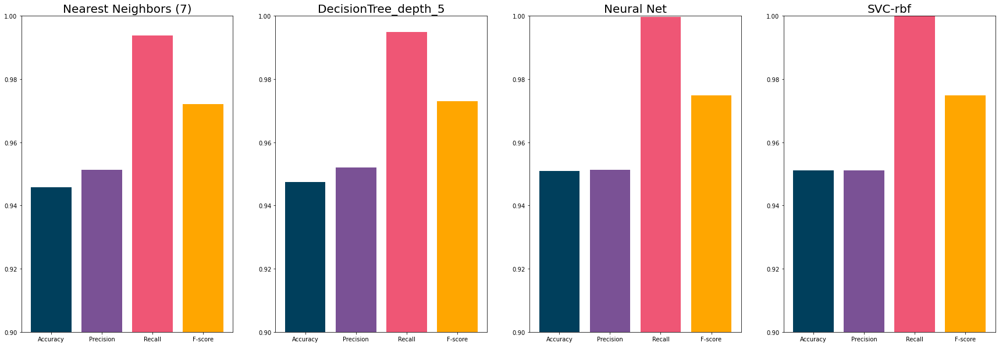


>>> Nearest Neighbors (7) <<<
Accuracy 0.946
Precision 0.951
Recall 0.994
F-score 0.972

>>> DecisionTree_depth_5 <<<
Accuracy 0.947
Precision 0.952
Recall 0.995
F-score 0.973

>>> Neural Net <<<
Accuracy 0.951
Precision 0.951
Recall 1.0
F-score 0.975

>>> SVC-rbf <<<
Accuracy 0.951
Precision 0.951
Recall 1.0
F-score 0.975


In [360]:
# df1 is custom imputation
X = df1.values[:,medical_columns] 
y = df1.values[:,11] # stroke yes or no
y = y.astype('int') # this needs to be of type int!

main(classifiers, names, splitter, X, y)

# 3) 
### - lifestyle features
### - KNN imputation of BMI feature

KNeighborsClassifier(n_neighbors=7) 
 [[972  50]
 [  0   0]]
DecisionTreeClassifier(max_depth=5) 
 [[972  50]
 [  0   0]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[967  48]
 [  5   2]]
KNeighborsClassifier(n_neighbors=7) 
 [[972  50]
 [  0   0]]
DecisionTreeClassifier(max_depth=5) 
 [[972  50]
 [  0   0]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[968  50]
 [  4   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[969  48]
 [  3   2]]
DecisionTreeClassifier(max_depth=5) 
 [[972  50]
 [  0   0]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[966  49]
 [  6   1]]
KNeighborsClassifier(n_neighbors=7) 
 [[968  50]
 [  4   0]]
DecisionTreeClassifier(max_depth=5) 
 [[970  49]
 [  2   1]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[963  48]
 [  9   2]]
KNeighborsClassifier(n_neighbors=7) 
 [[971  48]
 [  1   2]]
DecisionTreeClassifier(max_

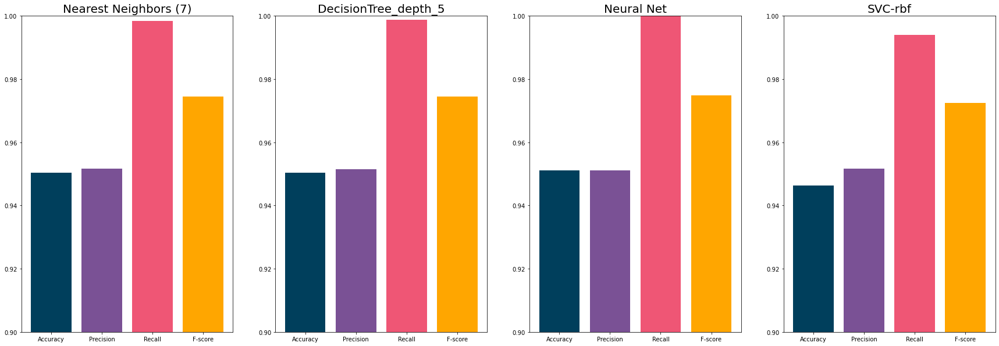


>>> Nearest Neighbors (7) <<<
Accuracy 0.95
Precision 0.952
Recall 0.998
F-score 0.974

>>> DecisionTree_depth_5 <<<
Accuracy 0.95
Precision 0.951
Recall 0.999
F-score 0.975

>>> Neural Net <<<
Accuracy 0.951
Precision 0.951
Recall 1.0
F-score 0.975

>>> SVC-rbf <<<
Accuracy 0.946
Precision 0.952
Recall 0.994
F-score 0.972


In [361]:
# df2 is KNN imputation
X = df2.values[:,lifestyle_columns] 
y = df2.values[:,11] # stroke yes or no
y = y.astype('int') # this needs to be of type int!

main(classifiers, names, splitter, X, y)


# 4) 
### - medical features
### - KNN imputation of BMI feature

KNeighborsClassifier(n_neighbors=7) 
 [[966  49]
 [  6   1]]
DecisionTreeClassifier(max_depth=5) 
 [[969  48]
 [  3   2]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[972  50]
 [  0   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[968  50]
 [  4   0]]
DecisionTreeClassifier(max_depth=5) 
 [[969  50]
 [  3   0]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[972  50]
 [  0   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[964  49]
 [  8   1]]
DecisionTreeClassifier(max_depth=5) 
 [[965  48]
 [  7   2]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[972  50]
 [  0   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[968  49]
 [  4   1]]
DecisionTreeClassifier(max_depth=5) 
 [[967  49]
 [  5   1]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[972  50]
 [  0   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[969  49]
 [  3   1]]
DecisionTreeClassifier(max_

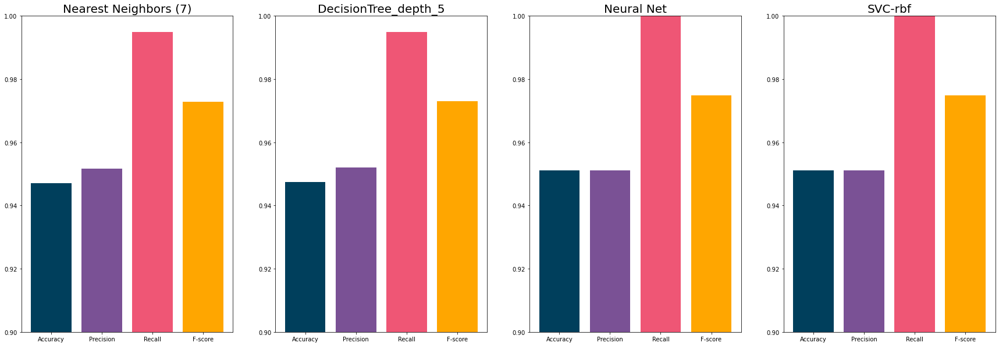


>>> Nearest Neighbors (7) <<<
Accuracy 0.947
Precision 0.952
Recall 0.995
F-score 0.973

>>> DecisionTree_depth_5 <<<
Accuracy 0.947
Precision 0.952
Recall 0.995
F-score 0.973

>>> Neural Net <<<
Accuracy 0.951
Precision 0.951
Recall 1.0
F-score 0.975

>>> SVC-rbf <<<
Accuracy 0.951
Precision 0.951
Recall 1.0
F-score 0.975


In [362]:
# df2 is KNN imputation
X = df2.values[:,medical_columns] 
y = df2.values[:,11] # stroke yes or no
y = y.astype('int') # this needs to be of type int!

main(classifiers, names, splitter, X, y)

# 5) 
### - all features
### - custom BMI imputation by gender and age

KNeighborsClassifier(n_neighbors=7) 
 [[968  49]
 [  4   1]]
DecisionTreeClassifier(max_depth=5) 
 [[969  47]
 [  3   3]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[972  50]
 [  0   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[968  50]
 [  4   0]]
DecisionTreeClassifier(max_depth=5) 
 [[968  50]
 [  4   0]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[972  50]
 [  0   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[966  50]
 [  6   0]]
DecisionTreeClassifier(max_depth=5) 
 [[965  48]
 [  7   2]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  49]
 [  0   1]]
SVC(C=1, gamma=2) 
 [[972  50]
 [  0   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[965  49]
 [  7   1]]
DecisionTreeClassifier(max_depth=5) 
 [[966  49]
 [  6   1]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[971  50]
 [  1   0]]
SVC(C=1, gamma=2) 
 [[972  50]
 [  0   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[967  50]
 [  5   0]]
DecisionTreeClassifier(max_

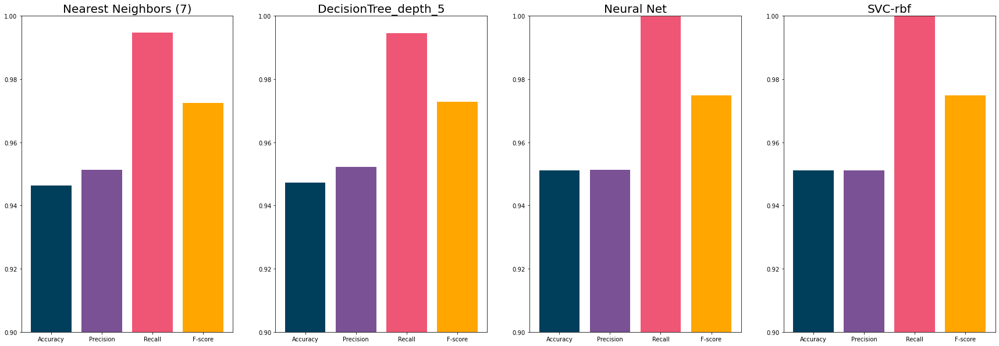


>>> Nearest Neighbors (7) <<<
Accuracy 0.946
Precision 0.951
Recall 0.995
F-score 0.972

>>> DecisionTree_depth_5 <<<
Accuracy 0.947
Precision 0.952
Recall 0.994
F-score 0.973

>>> Neural Net <<<
Accuracy 0.951
Precision 0.951
Recall 1.0
F-score 0.975

>>> SVC-rbf <<<
Accuracy 0.951
Precision 0.951
Recall 1.0
F-score 0.975


In [363]:
# df1 is KNN imputation
X = df1.values[:,all_columns] 
y = df1.values[:,11] # stroke yes or no
y = y.astype('int') # this needs to be of type int!

main(classifiers, names, splitter, X, y)

# 6) 
### - all features
### - KNN imputation of BMI feature

KNeighborsClassifier(n_neighbors=7) 
 [[969  49]
 [  3   1]]
DecisionTreeClassifier(max_depth=5) 
 [[969  49]
 [  3   1]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[972  50]
 [  0   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[969  49]
 [  3   1]]
DecisionTreeClassifier(max_depth=5) 
 [[969  50]
 [  3   0]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[972  50]
 [  0   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[965  49]
 [  7   1]]
DecisionTreeClassifier(max_depth=5) 
 [[963  48]
 [  9   2]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[972  50]
 [  0   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[967  49]
 [  5   1]]
DecisionTreeClassifier(max_depth=5) 
 [[967  49]
 [  5   1]]
MLPClassifier(alpha=1, max_iter=1000) 
 [[972  50]
 [  0   0]]
SVC(C=1, gamma=2) 
 [[972  50]
 [  0   0]]
KNeighborsClassifier(n_neighbors=7) 
 [[968  49]
 [  4   1]]
DecisionTreeClassifier(max_

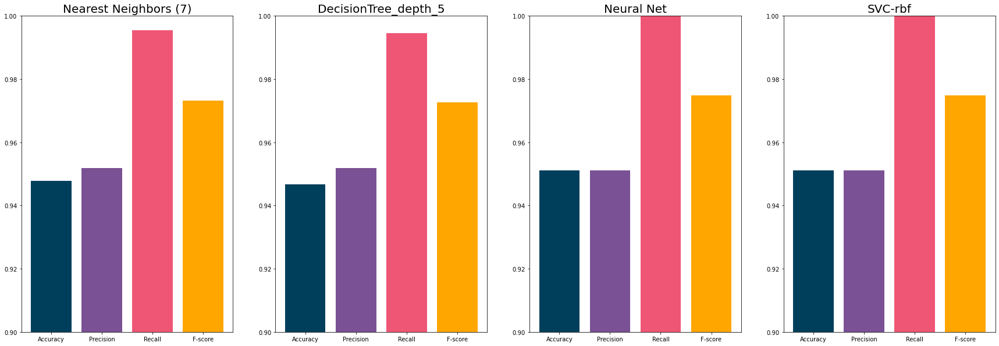


>>> Nearest Neighbors (7) <<<
Accuracy 0.948
Precision 0.952
Recall 0.995
F-score 0.973

>>> DecisionTree_depth_5 <<<
Accuracy 0.947
Precision 0.952
Recall 0.994
F-score 0.973

>>> Neural Net <<<
Accuracy 0.951
Precision 0.951
Recall 1.0
F-score 0.975

>>> SVC-rbf <<<
Accuracy 0.951
Precision 0.951
Recall 1.0
F-score 0.975


In [364]:
# df2 is KNN imputation
X = df2.values[:,all_columns] 
y = df2.values[:,11] # stroke yes or no
y = y.astype('int') # this needs to be of type int!

main(classifiers, names, splitter, X, y)

### References

- [scikit-learn.org classifiers](https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html)
